---
# Prevendo Preços de Aluguéis e Preços e Preços de Vendas de Apartamentos na Cidade de São Paulo

---

Este dataset possui dados referentes a preços de aluguéis e vendas de imóveis para a cidade de São Paulo - SP. O principal objetivo por trás deste notebook e previsão de preços de aluguéis e vendas de utilizando técnicas de **Machine Learning**, tratando-se mais especificamente de um problema de aprendizado supervisionado **(Regressão)**.

Os dados são provenientes de várias fontes, especialmente sites classificados de imóveis. O dataset pode ser encontrado no seguinte link [Sao Paulo Real Estate - Rent/Sales - April 2019](https://www.kaggle.com/argonalyst/sao-paulo-real-estate-sale-rent-april-2019/kernels)

In [1]:
# Manipulação de Dados
import numpy as np
import pandas as pd

# Visualização de Dados
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.subplots import make_subplots
from plotly.figure_factory import create_distplot

# Data Mining
import pingouin as pg 
import statsmodels.formula.api as smf
from math import sqrt 
from scipy.stats import boxcox
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Pré-processamento e Machine Learning
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PowerTransformer, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, Ridge, HuberRegressor, RANSACRegressor, TheilSenRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost.sklearn import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Otimização
from skopt import gp_minimize
from skopt.plots import plot_convergence
from skopt.space import Real, Integer, Categorical
from skopt.utils import use_named_args

# Métricas
from yellowbrick.regressor import ResidualsPlot, PredictionError
from yellowbrick.model_selection import LearningCurve

# Configurando o estilo de gráfico utilizado
%matplotlib inline
plt.rcParams["figure.figsize"] = 20, 10
plt.style.use('fivethirtyeight')
pd.options.plotting.backend = "plotly"

# Ignorando os avisos
import warnings
warnings.filterwarnings('ignore')

/home/bobcasta/anaconda3/lib/python3.7/site-packages/outdated/utils.py:18: OutdatedPackageWarning:

The package pingouin is out of date. Your version is 0.3.4, the latest is 0.3.5.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.

/home/bobcasta/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning:

The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.



In [2]:
# Carrega o dataset com preços de alugueis da cidade de São Paulo
df = pd.read_csv('sao-paulo-properties.csv')

# Vendo as 5 primeiras linhas
df.head()

,Price,Condo,Size,Rooms,Toilets,Suites,Parking,Elevator,Furnished,Swimming Pool,New,District,Negotiation Type,Property Type,Latitude,Longitude
0,930,220,47,2,2,1,1,0,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.543138,-46.479486
1,1000,148,45,2,2,1,1,0,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.550239,-46.480718
2,1000,100,48,2,2,1,1,0,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.542818,-46.485665
3,1000,200,48,2,2,1,1,0,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.547171,-46.483014
4,1300,410,55,2,2,1,1,1,0,0,0,Artur Alvim/São Paulo,rent,apartment,-23.525025,-46.482436


In [3]:
# Vendo informações sobre tipos de variáveis
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13640 entries, 0 to 13639
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Price             13640 non-null  int64  
 1   Condo             13640 non-null  int64  
 2   Size              13640 non-null  int64  
 3   Rooms             13640 non-null  int64  
 4   Toilets           13640 non-null  int64  
 5   Suites            13640 non-null  int64  
 6   Parking           13640 non-null  int64  
 7   Elevator          13640 non-null  int64  
 8   Furnished         13640 non-null  int64  
 9   Swimming Pool     13640 non-null  int64  
 10  New               13640 non-null  int64  
 11  District          13640 non-null  object 
 12  Negotiation Type  13640 non-null  object 
 13  Property Type     13640 non-null  object 
 14  Latitude          13640 non-null  float64
 15  Longitude         13640 non-null  float64
dtypes: float64(2), int64(11), object(3)
memo

O dataset possui 16 atributos, sendo eles:

1. `Price`: Preço final anunciado(em real);
2. `Condo`: Despesas do condomínio;
3. `Size`: tamanho da propriedade em metros quadrados m² (apenas áreas privadas);
4. `Rooms`: Número de quartos;
5. `Toilets`: Número de banheiros;
6. `Suites`: Número de quartos com banheiro privativo;
7. `Parking`: Número de vagas de estacionamento;
8. `Elevator`: binário: 1 se houver elevador no prédio, 0 caso contrário;
9. `Furnished`: 1 se a propriedade é divertida, 0 caso contrário:
10. `Swimming Pool`: 1 se a propriedade tiver piscina, 0 caso contrário;
11. `New`: 1 se a propriedade for muito recente, 0 caso contrário;
12. `District`: bairro e a cidade onde a propriedade está localizada;
13. `Negotiation Type`: Venda ou Aluguel;
14. `Property Type`: tipo de propriedade;
15. `LatitudeGeographic`: Localização - Latitude;
16. `LongitudeGeographic`: Localização - Longitude;

Alguns atributos parecem estar separados com espaços em seus nomes, vamos substituir esses espaços por **_**

In [4]:
# Substituindo " " por "_" nos nomes das variáveis
df.columns = df.columns.str.replace(' ', '_')

Vamos checar se exitem valores nulos em nossas variáveis

Algumas variáveis são dos tipos **int** ou object quando verdade as mesmas representam categorias, pois, possuem poucos valores. Para mudar isso vamos mudar o tipo dessas variáveis para **Category**, assim teremos o dataset já ajustado para facilitar anaálise posteriores. O bloco de código abaixo faz exatamente isso.

In [5]:
# Transformando atributos categóricos para o tipo 'category'
cat_var = ['Elevator', 'Furnished', 'Swimming_Pool', 'New', 'District', 'Negotiation_Type', 'Property_Type']

# Muda o tipo das variáveis
for i in df:
    df[cat_var] = df[cat_var].astype('category')
    
# Checando os tipos das variáveis
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13640 entries, 0 to 13639
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Price             13640 non-null  int64   
 1   Condo             13640 non-null  int64   
 2   Size              13640 non-null  int64   
 3   Rooms             13640 non-null  int64   
 4   Toilets           13640 non-null  int64   
 5   Suites            13640 non-null  int64   
 6   Parking           13640 non-null  int64   
 7   Elevator          13640 non-null  category
 8   Furnished         13640 non-null  category
 9   Swimming_Pool     13640 non-null  category
 10  New               13640 non-null  category
 11  District          13640 non-null  category
 12  Negotiation_Type  13640 non-null  category
 13  Property_Type     13640 non-null  category
 14  Latitude          13640 non-null  float64 
 15  Longitude         13640 non-null  float64 
dtypes: category(7), float6

Com o tipo de variáveis organizadas vamos análisar a variável `District`. Essa variável é referente aos bairros da cidade de São Paulo presentes no conjunto de dados, ela contém o nome do bairro e esta dividida por **/** seguido pelo nome do município no caso só existe um município que é São Paulo capital.

Para este atributo categorico em especifico vamos "dividi-lo" com o método **.str.split()** e assim obter apenas o nome do bairro, já que exitem apenas imóveis para o município de São Paulo não faz sentido dividir esta variável em duas, então manteremos apenas o nome do bairro, em seguida vamos ver a quantidade de bairros diferentes que existem no atributo `District`.

In [6]:
df['Negotiation_Type'].value_counts()

rent    7228
sale    6412
Name: Negotiation_Type, dtype: int64

In [7]:
# Dividi a variáel "District" por "/"
df['District'] = df['District'].str.split('/', 1, expand=True)

# Checando a quantidade de bairros diferentes que exitem no conjunto de dados
df['District'].nunique()

96

Agora com nossa variável dividida e sabemos que existem **96 bairros diferentes** no conjunto de dados, Para analises posteriores não faz sentido criar **96 variáveis dummies** para cada bairro diferente. 

Para isso vamos dividir esses bairros por regiões da cidade de São Paulo e assim, criar um novo atributo. para poder descobrir qual bairros pertencem a qual região no município São Paulo. Para decobrir bairros por região foi consultado esse [link](http://g1.globo.com/sao-paulo/noticia/2013/11/veja-distribuicao-oficial-dos-bairros-nas-cinco-regioes-da-cidade.html) que contém uma lista com os nomes dos bairros e a zona a qual o bairro pertence.

In [8]:
# Listas com os bairros pertecente a sua específica região na cidade de São Paulo
Zona_Central = ['Bela Vista','Bom Retiro','Cambuci', 'Consolação', 'Liberdade', 
                'República', 'Santa Cecília', 'Sé', 'Cursino']

Zona_Norte = ['Casa Verde', 'Cachoeirinha', 'Limão', 'Brasilândia', 'Freguesia do Ó', 
              'Jaçanã', 'Tremembé', 'Perus','Anhanguera', 'Pirituba', 'Jaraguá', 
              'São Domingos', 'Santana', 'Tucuruvi', 'Mandaqui', 'Vila Maria', 
              'Vila Guilherme', 'Medeiros']

Zona_Sul = ['Campo Limpo','Capão Redondo', 'Vila Andrade', 'Cidade Dutra','Grajaú', 'Socorro', 
            'Cidade Ademar', 'Pedreira', 'Ipiranga', 'Sacomã', 'Jabaquara', 'M Boi Mirim', 
            'Jardim Ângela', 'Jardim São Luis', 'Perelheiros', 'Marsilac', 'Santo Amaro', 
            'Campo Belo', 'Campo Grande', 'Moema', 'Saúde', 'Vila Mariana', 'Brooklin']

Zona_Leste = ['Aricanduva', 'Carrão', 'Vila Formosa', 'Cidade Tiradentes', 'Ermelino Matarazzo', 
              'Ponte Rasa','Guaianazes', 'Lajeado', 'Itaim Paulista', 'Vila Curuçá', 'Itaquera', 
              'Cidade Líder', 'José Bonifácio', 'Parque do Carmo', 'Mooca', 'Belém', 'Brás', 
              'Moóca', 'Pari', 'Tatuapé', 'Penha', 'Artur Alvim', 'Cangaíba', 'Penha', 
              'Vila Matilde', 'São Mateus', 'São Rafael', 'São Miguel', 'Jardim Helena', 
              'Vila Jacuí', 'Sapopemba', 'Vila Prudente', 'São Lucas', 'Iguatemi', 'Água Rasa']

Zona_Oeste = ['Morumbi', 'Raposo Tavares', 'Rio Pequeno', 'Butantã', 'Vila Sônia', 'Lapa', 
              'Barra Funda', 'Jaguara', 'Jaguaré', 'Perdizes', 'Vila Leopoldina', 'Pinheiros',
              'Alto de Pinheiros', 'Itaim Bibi', 'Jardim Paulista', 'Pinheiros', 'Vila Madalena', 
              'Vila Olimpia']

Com as listas bairros por regiões criadas, agora criaremos uma função para atribuir o bairro a sua região especifica para a criação da nova variável.

In [9]:
# Cria a função para atribuição do nome da região pelo nome do bairro
def zones(df) :
    
    if df["District"] in Zona_Central:
        return "Zona Central"
    elif df["District"] in Zona_Norte:
        return "Zona Norte"
    elif df["District"] in Zona_Sul:
        return "Zona Sul"
    elif df["District"] in Zona_Leste:
        return "Zona Leste"
    elif df["District"] in Zona_Oeste:
        return "Zona Oeste"

# Aplica a função para criação da nova variável
df["Zone"] = df.apply(lambda df:zones(df), axis = 1)

# Transforma a variável para tipo "Category"
df['Zone'] = df['Zone'].astype('category')

In [10]:
# Checando valores nulos
df.isnull().sum()

Price               0
Condo               0
Size                0
Rooms               0
Toilets             0
Suites              0
Parking             0
Elevator            0
Furnished           0
Swimming_Pool       0
New                 0
District            0
Negotiation_Type    0
Property_Type       0
Latitude            0
Longitude           0
Zone                0
dtype: int64

Agora com as variáveis ja organizadas e depois de checarmos que não existem valores nulos em nenhuma das variáveis, vamos examinar variáveis que possam ser desinteressantes para nossa análise para que possamos descarta-las. 

Logo após isso vamos analisar o atributo `Negotiation Type` para descobrir se existem mais de um tipo de negociação dos imóveis (ex: Aluguel ou Venda) a fim de dividir o dataset em dois por meio deste atributo, pois não faz sentido análisar aluguéis e vendas em conjunto.

In [11]:
# Checa os valores de "Property_Type"
df['Property_Type'].value_counts()

apartment    13640
Name: Property_Type, dtype: int64

Já que todos os imóveis possuem o mesmo tipo, podemos excluir esta variável do conjunto de dados.

In [12]:
# Exclui a variável "Property_Type" de dados
df.drop('Property_Type', axis=1, inplace=True)

In [13]:
# Checa os valores de "Negotioation Type"
df['Negotiation_Type'].value_counts()

rent    7228
sale    6412
Name: Negotiation_Type, dtype: int64

In [14]:
# Dataset com preços de alugéis de imóveis
rent = df[df['Negotiation_Type'] == 'rent']

# Dataset com preço de vendas de imóveis
sale = df[df['Negotiation_Type'] == 'sale']

rent.reset_index(drop=True, inplace=True)
sale.reset_index(drop=True, inplace=True)

In [15]:
sale.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6412 entries, 0 to 6411
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Price             6412 non-null   int64   
 1   Condo             6412 non-null   int64   
 2   Size              6412 non-null   int64   
 3   Rooms             6412 non-null   int64   
 4   Toilets           6412 non-null   int64   
 5   Suites            6412 non-null   int64   
 6   Parking           6412 non-null   int64   
 7   Elevator          6412 non-null   category
 8   Furnished         6412 non-null   category
 9   Swimming_Pool     6412 non-null   category
 10  New               6412 non-null   category
 11  District          6412 non-null   object  
 12  Negotiation_Type  6412 non-null   category
 13  Latitude          6412 non-null   float64 
 14  Longitude         6412 non-null   float64 
 15  Zone              6412 non-null   category
dtypes: category(6), float64(

In [16]:
# Exclui a variavel "Negotiation_Type" dos dois dataset
rent.drop('Negotiation_Type', axis=1, inplace=True)
sale.drop('Negotiation_Type', axis=1, inplace=True)

Agora que o dataset foi separado pelo tipo de negociação (aluguel e venda) podemos dar continuidade a nossa análise.

Primeiro vamos realizar uma análise no dataset que contém dados referente aos **preços de vendas de apartamentos**, começando por uma análise exploratória dos dados quantitivos e qualitativos, seguido por, preparação e transformação dos dados, criação e escolha do melhor algoritmo para previsão dos preços de aluguéis e por fim criação e análise das métricas de avaliação do modelo escolhido.

O dataset contendo os dados referentes a **preço de aluguéis** terá sua análise feita em seguida, tendo como mesma ordem do processo da análise que será feita para o dataset com preços de vendas de imóveis.

In [17]:
# Imprime o número de linhas e colunas do conjunto de dados de vendas
print('Número de Linhas do Dataset: ', sale.shape[0])
print('Número de colunas do Dataset: ', sale.shape[1])

Número de Linhas do Dataset:  6412
Número de colunas do Dataset:  15


Agora com os dados organizados podemos partir para uma investigação mais profunda no conjunto de dados. Vamos iniciar a análise pela variável alvo **"Price"** e se necessário realizando algumas transformações na mesma. Primeiro vamos ver um resumo estatístico com as medidas de **tendência central** da variável em seguida vamos visualizar sua distribuição por meio de seu **histograma**.

In [18]:
# Resumo estatístico da variável alvo "Price"
sale['Price'].describe()

count    6.412000e+03
mean     6.086241e+05
std      7.404515e+05
min      4.200000e+04
25%      2.500000e+05
50%      3.800000e+05
75%      6.790000e+05
max      1.000000e+07
Name: Price, dtype: float64

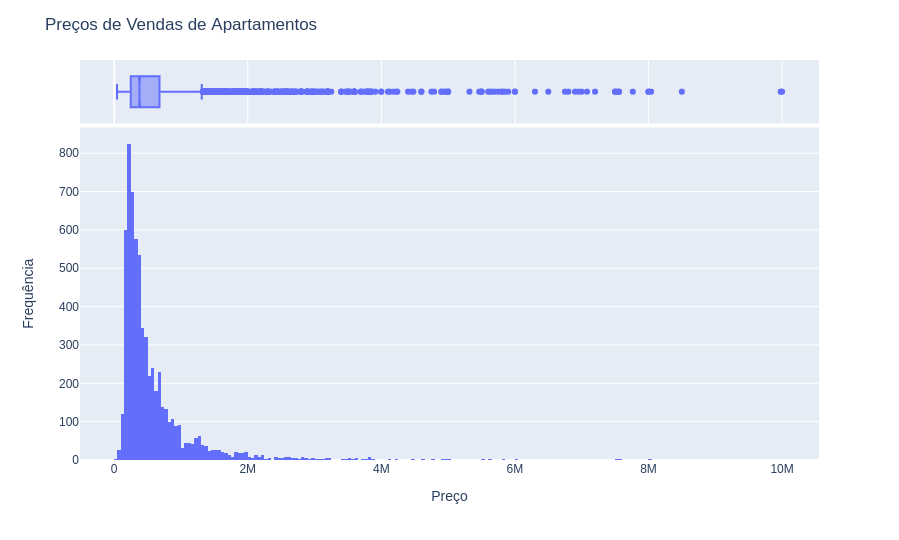

In [19]:
# Histograma com os preços de aluguéis de apartamentos
fig = px.histogram(sale, 
                   x='Price', 
                   marginal='box')

# Define o layout
fig.update_layout(title='Preços de Vendas de Apartamentos', 
                  xaxis_title="Preço",
                  yaxis_title="Frequência",
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Pelo histograma da variável preço fica visível que a mesma não possui uma distribuição normal, além de que, o preço de venda possuem uma assimetria positiva tendo uma cauda longa a direita, devido a poucos preços de aluguéis muito elevados, e com ajuda do gráfico box-plot acima podemos ver tais valores são outliers.

Isso será corrigido daqui a pouco por meio de um transformação de **Box-Cox**, mas antes de realizar esta investigação, vamos dar uma olhar no gráfico do preço em relação ao tamanho dos imóveis para que possamos saber mais a respeito.

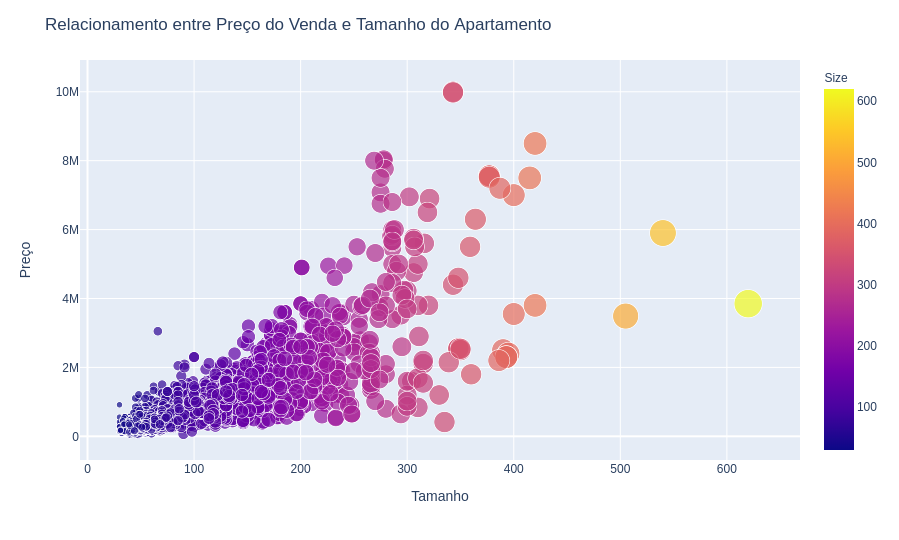

In [20]:
# Scatterplot dos preços de aluguéis por seu tamanho
fig = px.scatter(sale, 
                 x='Size', 
                 y='Price', 
                 color='Size', 
                 size='Size')

# Define o layout
fig.update_layout(title='Relacionamento entre Preço do Venda e Tamanho do Apartamento', 
                  xaxis_title="Tamanho",
                  yaxis_title="Preço",
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

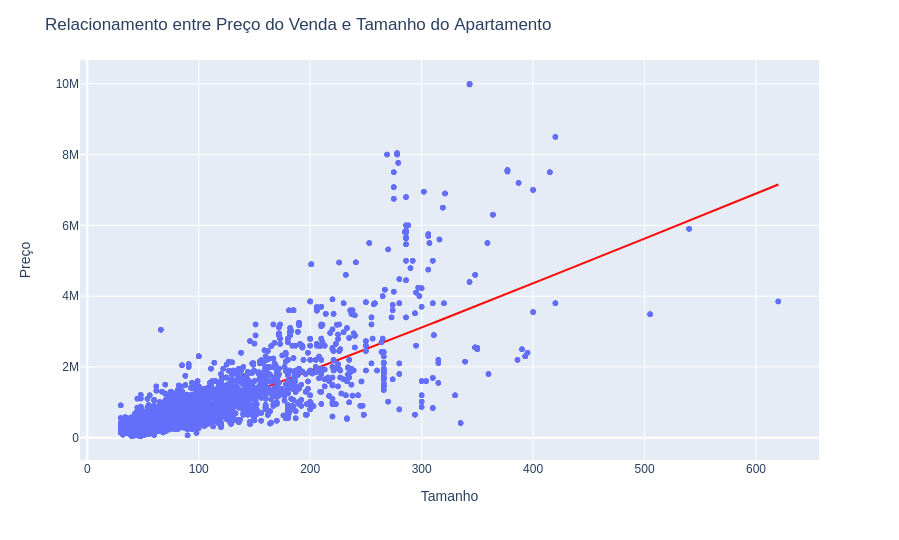

In [21]:
# Relacionamento entre "Price" e "Size", através de uma Regressão LOWESS
# Cria o gráfico
fig = px.scatter(sale, 
                 x='Size', 
                 y='Price', 
                 trendline='lowess', 
                 trendline_color_override='red')

# Define o layout
fig.update_layout(title='Relacionamento entre Preço do Venda e Tamanho do Apartamento', 
                  xaxis_title="Tamanho",
                  yaxis_title="Preço",
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Os preços de venda possuem uma relação positiva com o tamanho do apartamento, essa é uma relação que possui sentido partindo da teoria econômica. Porém podemos notar que existem mais imóveis com **menos de 200 mt²** e um **preço inferior a 2.000.000**.

Obviamente neste conjunto de dados não possui imóveis apenas para venda residêncial, isso se baseando no **preços dos imóveis e seus respectivos tamnhos**. Para uma cidade metropolitana como de São Paulo é provável que apartamentos que possuem um elevado preço no caso acima de **2.000.000** ou um **tamanho acima de 200 mt²** terão grandes chances dos mesmos serem imóveis comerciais. 

Com base nesta regra vamos criar uma nova variável para nosso conjunto de dados de preços de vendas `Comercial`. Essa variável será do tipo **bool** sendo que **False para imóveis residênciais** e **True para imóveis comerciais**.

In [22]:
# Criando uma nova variável
sale['Comercial'] = (sale['Price'] >= 2000000) | (sale['Size'] >= 200)

# Checando a quantidade de apartamentos comerciais
sale['Comercial'].value_counts()

False    6089
True      323
Name: Comercial, dtype: int64

In [23]:
sale['Comercial'] = sale['Comercial'].map({True: 1,
                                           False: 0})

sale['Comercial'].value_counts()

0    6089
1     323
Name: Comercial, dtype: int64

Agora com a nossa nova variável criada vamos continuar nossa análise exploratória, mas específicamente no atributo `Price`, vamos verificar novamente sua distribuição porém desta vez por meio de **qqplot**.

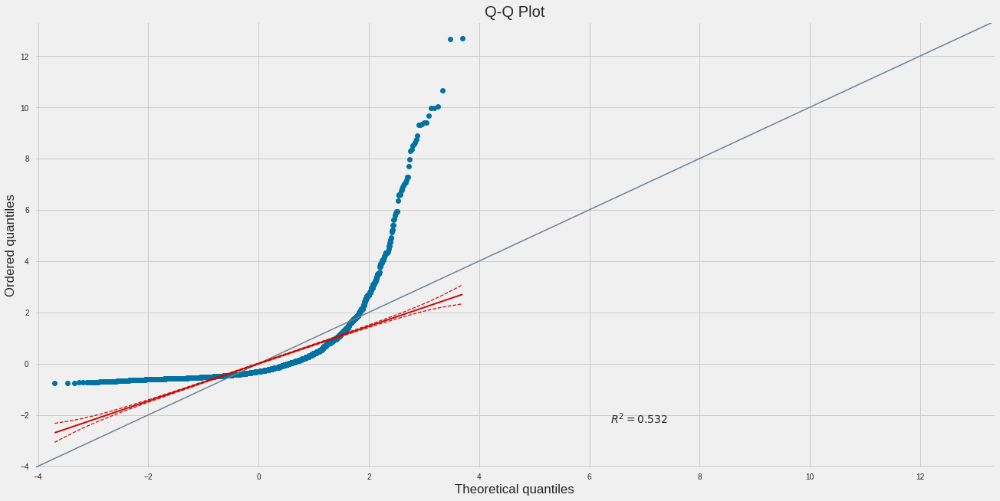

In [24]:
# Cria o gráfico
pg.qqplot(sale['Price'], dist='norm', figsize=(20, 10))

# Mostra o gráfico
plt.show()

O gráfico **quantil-quantil (qqplot)** é uma ferramenta muito útil para checar adequação de distribuição de frequência dos dados à uma distribuição de probabilidades. 

O gráfico q-q é melhor que o histograma e o gráfico de distribuição acumulada empírica porque nós temos mais habilidade para verificar se uma reta se ajusta aos pontos do que se uma curva de densidade se ajusta a um histograma ou uma curva de probabilidade acumulada se ajusta à acumulada empírica.

Por do gráfico acima podemos checar que a distribuição não é uma distribuição normal, tendo um **R² de 0.532**, para tentar ajustar isso  vamos realizar uma transformação de **box-cox** na variável preço. Porém vamos checar a presença de outliers e verificar como os mesmos são afetados depois de feita a transformação de box-cox

Agora vamos realizar a transformação de box-cox, mas para ao ivés de fazer isso no atributo `Price` vamos criar em um novo atributo, pois precisaremos dos preços originais para a fase de **engenharia de atributos**.

In [25]:
# Cria a nova variável por meio da aplicação da Transformação Box-Cox
sale['Price_Box'], lam_value = boxcox(sale['Price'])

# Imprime o valor ideal de Lambda
print('Valor Ideal de Lambda: %f' % lam_value)

Valor Ideal de Lambda: -0.387670


In [26]:
sale['Price_Box'].describe()

count    6412.000000
mean        2.562050
std         0.004530
min         2.537898
25%         2.558671
50%         2.561794
75%         2.565364
max         2.574525
Name: Price_Box, dtype: float64

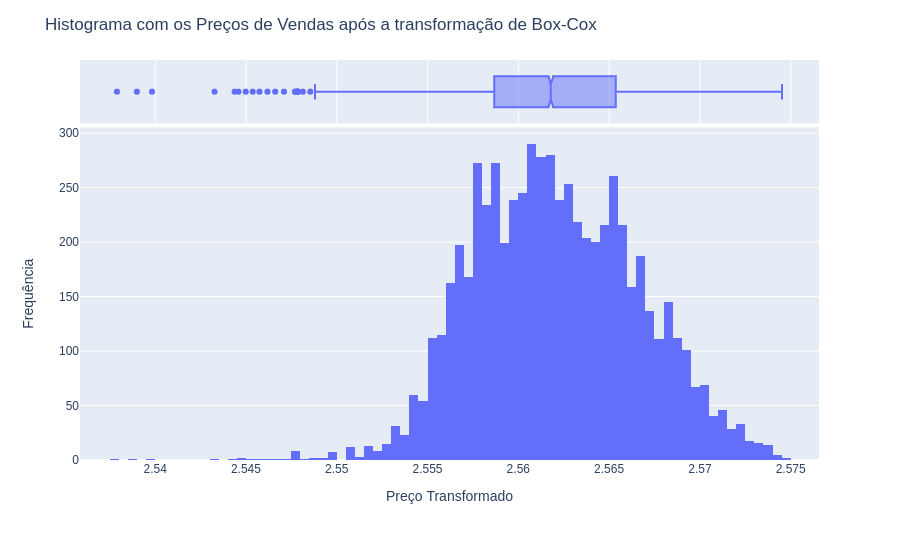

In [27]:
# Histograama com os preços de vendas de apartamentos
fig = px.histogram(sale, 
                   x='Price_Box', 
                   marginal='box')

# Define o layout
fig.update_layout(title='Histograma com os Preços de Vendas após a transformação de Box-Cox', 
                  xaxis_title="Preço Transformado",
                  yaxis_title="Frequência",
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

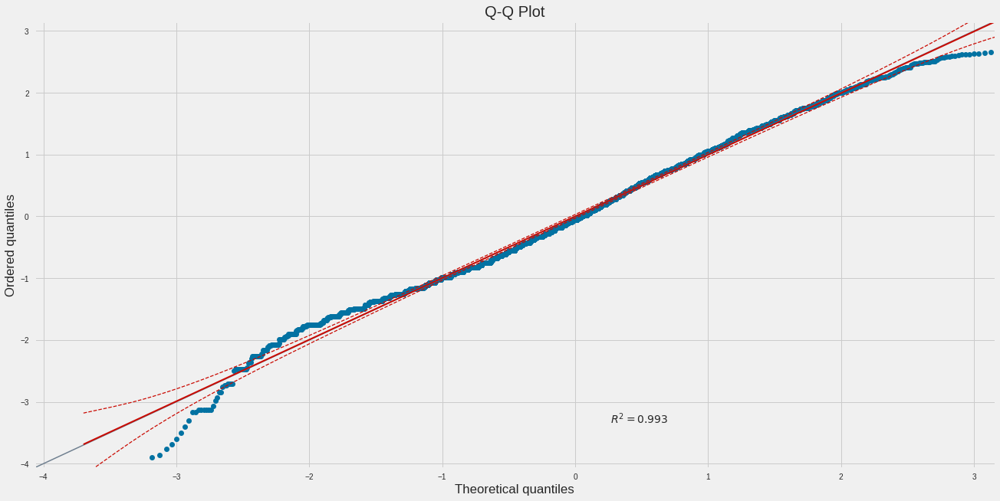

In [28]:
# Cria o gráfico
pg.qqplot(sale['Price_Box'], dist='norm', figsize=(20, 10))

# Mostra o gráfico
plt.show()

Podemos notar que após a transformação as medidas de tendência central e a distribuição da nossa variável mudou, por meio do qqplot acima podemos ver que agora a ditribuição dos preços tem o mesmo formato de uma curva normal com um **R² de 0.993**.

Vamos agora checar como os outlier que estavam antes presentes nos dados ficaram, por meio do **box-plot** e **violin-plot**.

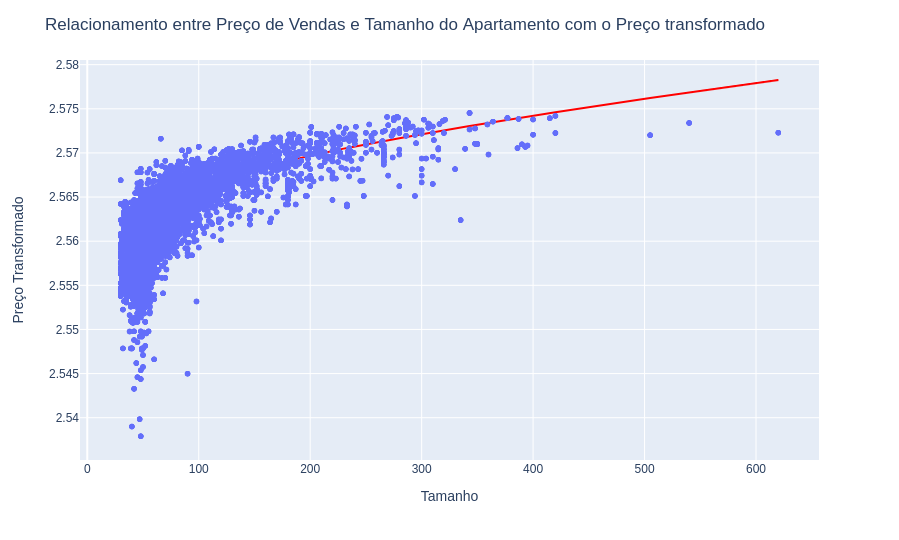

In [29]:
# Relacionamento entre "Price_Box" e "Size", através de uma Regressão LOWESS
# Cria o gráfico
fig = px.scatter(sale, 
                 x='Size', 
                 y='Price_Box', 
                 trendline='lowess', 
                 trendline_color_override='red')

# Define o layout
fig.update_layout(title='Relacionamento entre Preço de Vendas e Tamanho do Apartamento com o Preço transformado',
                  xaxis_title="Tamanho",
                  yaxis_title="Preço Transformado",
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Realizada a análise na variável alvo `Price` vamos continuar nossa análise exploratória porém, agora nas variáveis qualitativas. Em nosso dataset possuimos 7 variáveis qualitativas, de inicio vamos observar a contagem de valores para cada categória em seguida vamos olhar os gráficos de barras das seis primeiras (`Elevator`, `Furnished` , `Swimming_Pool`, `New`, `Comercial`, `District` e `Zone`).

In [30]:
# Seleciona as variáveis qualitativas
cat_vars = ['Elevator', 'Furnished', 'Swimming_Pool', 'New', 'Comercial', 'Zone']

# Realiza uma contagem de valores de cada categória dos atributos categóricos
for i in sale[cat_vars]:
    print('Variável: ' +(i), '\n', sale[i].value_counts())

Variável: Elevator 
 0    3748
1    2664
Name: Elevator, dtype: int64
Variável: Furnished 
 0    5660
1     752
Name: Furnished, dtype: int64
Variável: Swimming_Pool 
 1    3459
0    2953
Name: Swimming_Pool, dtype: int64
Variável: New 
 0    6205
1     207
Name: New, dtype: int64
Variável: Comercial 
 0    6089
1     323
Name: Comercial, dtype: int64
Variável: Zone 
 Zona Leste      2300
Zona Sul        1183
Zona Norte      1048
Zona Central     959
Zona Oeste       922
Name: Zone, dtype: int64


In [31]:
# Dropa a variável "New" do modelo
sale.drop('New', axis=1, inplace=True)

Observando a variável `New` vemos que a mesma é muito desbalanceada sendo que **6205 aparatamentos não são apartamentos novos** no caso recém construídos, enquanto apenas **207 dos apartamentos são realmente novos, menos do que 5% do valor total**, então e provável que essa variável não seja relevante para a construção do modelo, partindo deste ponto vamos exclui-lá da nossa análise.

Agora podemos plotar os gráficos das variáveis qualitativas.

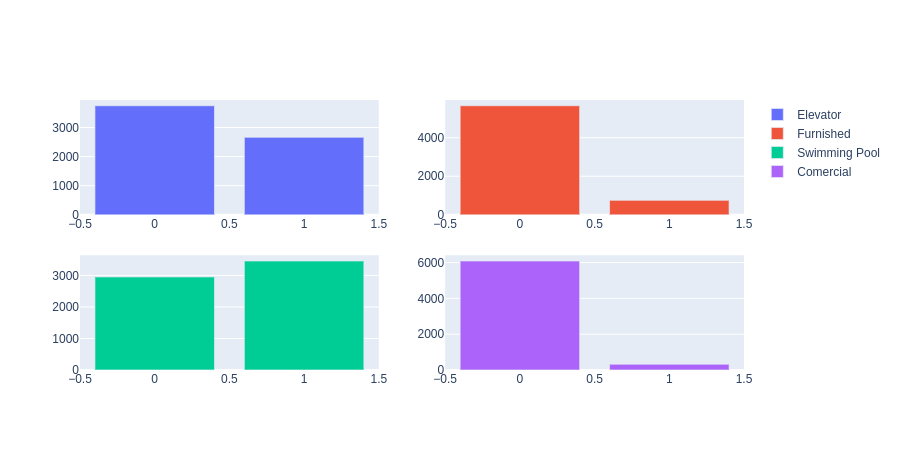

In [32]:
# Criando os subplots
fig = make_subplots(rows=2, cols=2)

# Cria os gráficos de barras
fig.add_trace(go.Bar(x=sale['Elevator'].value_counts().index, 
                     y=sale['Elevator'].value_counts(), name='Elevator'), 1, 1)

fig.add_trace(go.Bar(x=sale['Furnished'].value_counts().index, 
                     y=sale['Furnished'].value_counts(), name='Furnished'), 1, 2)

fig.add_trace(go.Bar(x=sale['Swimming_Pool'].value_counts().index, 
                     y=sale['Swimming_Pool'].value_counts(), name='Swimming Pool'), 2, 1)

fig.add_trace(go.Bar(x=sale['Comercial'].value_counts().index, 
                     y=sale['Comercial'].value_counts(), name='Comercial'), 2, 2)

# Mostra os gráficos
fig.show()

Os gráficos de barras deixam claro que existem uma maior oferta de apartamentos para aluguel que **não possuem elevador (3748), que não são mobiliados (5660) e não são para uso comercial (6566)**, referente a existencia ou nao de **piscina nos apartamentos** é muito balanceado com cerca **2953 apartamentos sem piscina** e **3459 apartamentos com piscina**.

Agora que observamos os valores de cada um das variáveis qualitivas que possuem valores binários, vamos olhar os relacionamentos de cada uma dessas variáveis por meio das distribuições dos preços dividido por cada um dos valores binários, assim será possível checar se os por exemplo de apartamentos que possuem elevadores tendem a possuir um aluguel maior do que aqueles que nao possuem.

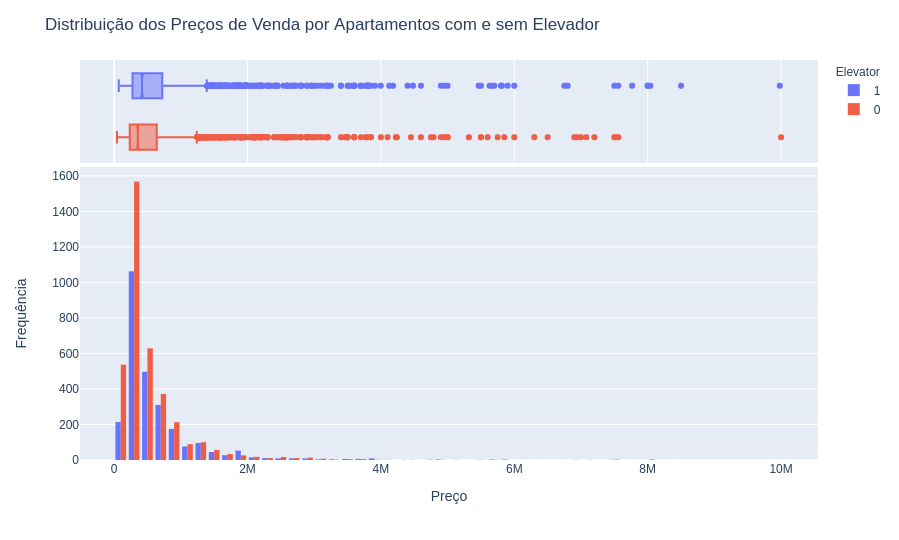

In [33]:
# Distribuição dos preços dos apartamentos semgmentados pelos apartamentos com e sem elevador
fig = px.histogram(sale, 
                   x='Price', 
                   color='Elevator', 
                   marginal='box', 
                   barmode='group', 
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Venda por Apartamentos com e sem Elevador',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

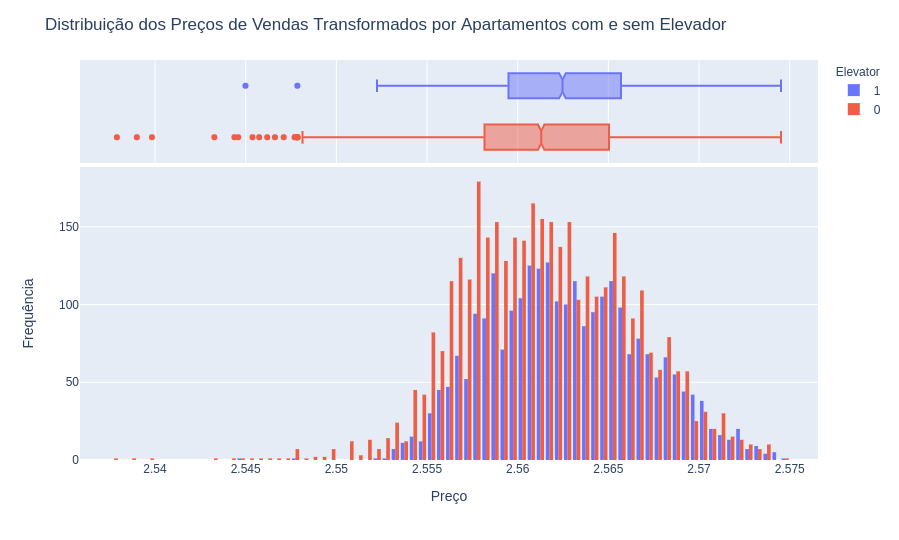

In [34]:
# Distribuição dos preços transformados dos apartamentos divididos pelos apartamentos com e sem elevador
fig = px.histogram(sale, 
                   x='Price_Box', 
                   color='Elevator', 
                   marginal='box', 
                   barmode='group', 
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Vendas Transformados por Apartamentos com e sem Elevador',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Os gráficos assim indicam que os apartamentos que **possuem ou não possuem elevador tendem a terem uma distribuição de preço de venda semelhante** porém, apartamentos sem elevadores aparecem com uma maior frequência no conjunto de dados.

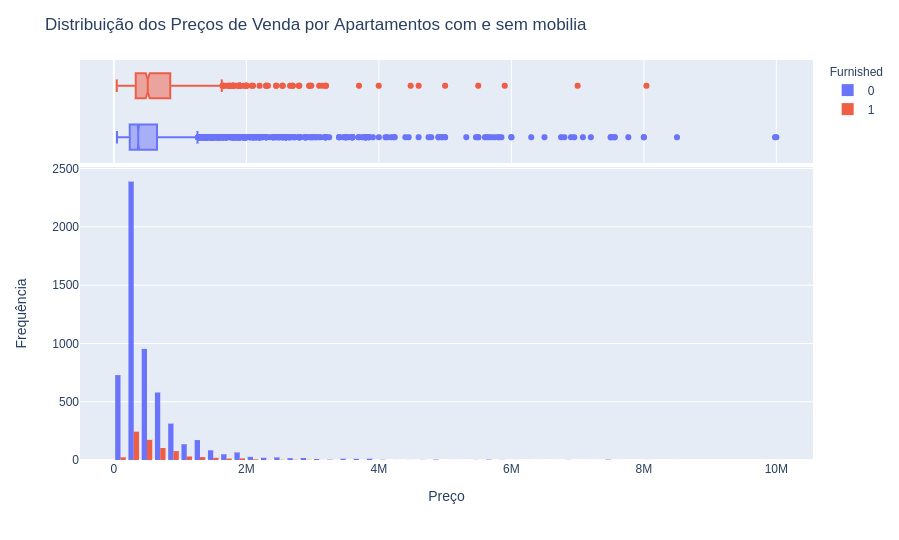

In [35]:
# Distribuição dos preços dos apartamentos divididos pelos apartamentos com e sem mobilia
fig = px.histogram(sale, 
                   x='Price', 
                   color='Furnished', 
                   marginal='box', 
                   barmode='group', 
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Venda por Apartamentos com e sem mobilia',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

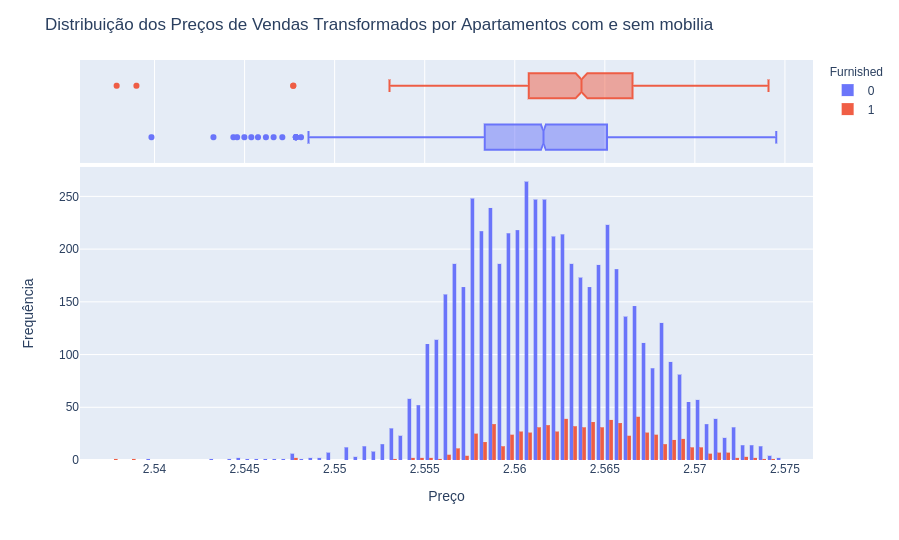

In [36]:
# Distribuição dos preços dos apartamentos divididos pelos apartamentos com e sem mobilia
fig = px.histogram(sale, 
                   x='Price_Box', 
                   color='Furnished', 
                   marginal='box', 
                   barmode='group', 
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Vendas Transformados por Apartamentos com e sem mobilia',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Os gráficos assim indicam que os apartamentos que **são mobíliados tendem a terem um preço um pouco maior do que aqueles que não são** porém serem ofertados em quatidades bem menores.

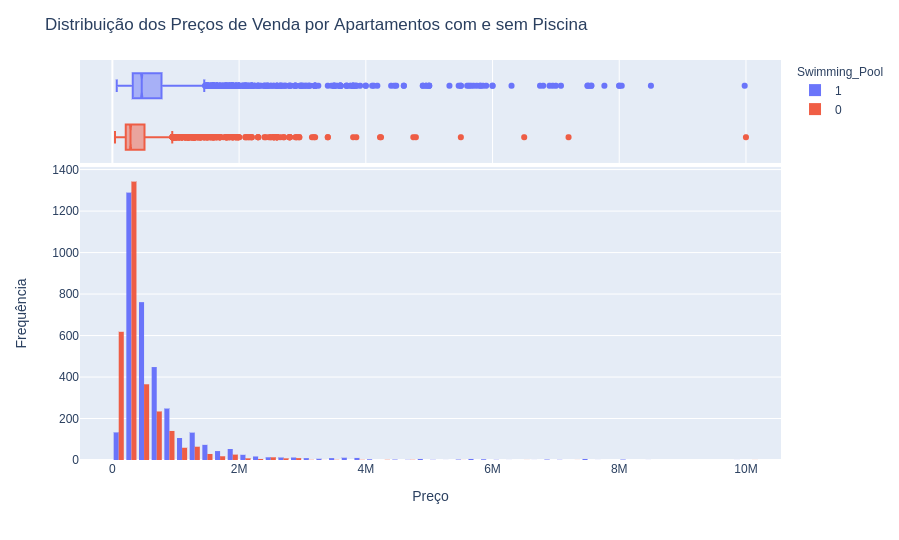

In [37]:
# Distribuição dos preços dos apartamentos divididos pelos apartamentos com e sem piscina
fig = px.histogram(sale, 
                   x='Price', 
                   color='Swimming_Pool', 
                   marginal='box', 
                   barmode='group', 
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Venda por Apartamentos com e sem Piscina',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

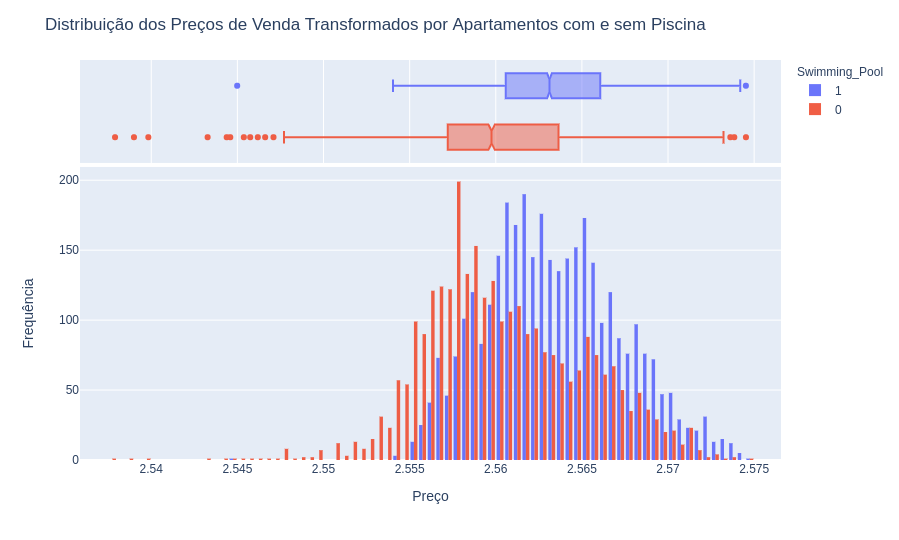

In [38]:
# Distribuição dos preços dos apartamentos divididos pelos apartamentos com e sem piscina
fig = px.histogram(sale, 
                   x='Price_Box', 
                   color='Swimming_Pool', 
                   marginal='box', 
                   barmode='group',
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Venda Transformados por Apartamentos com e sem Piscina',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Os gráficos assim indicam que os apartamentos que **possuem piscina tendem a terem um preço maior de aluguel do que aqueles não possuem**.

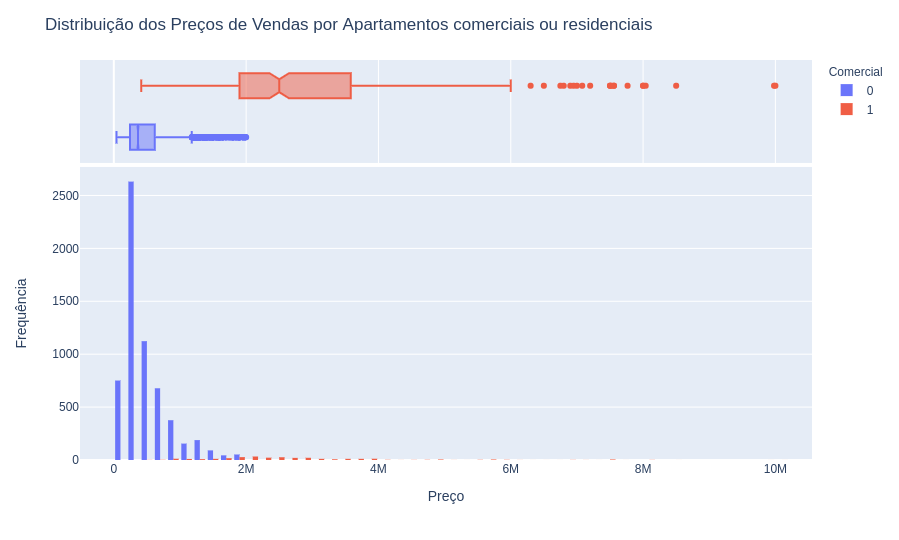

In [39]:
# Distribuição dos preços dos apartamentos divididos pelos apartamentos residenciais e comerciais
fig = px.histogram(sale, 
                   x='Price', 
                   color='Comercial', 
                   marginal='box', 
                   barmode='group', 
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Vendas por Apartamentos comerciais ou residenciais',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

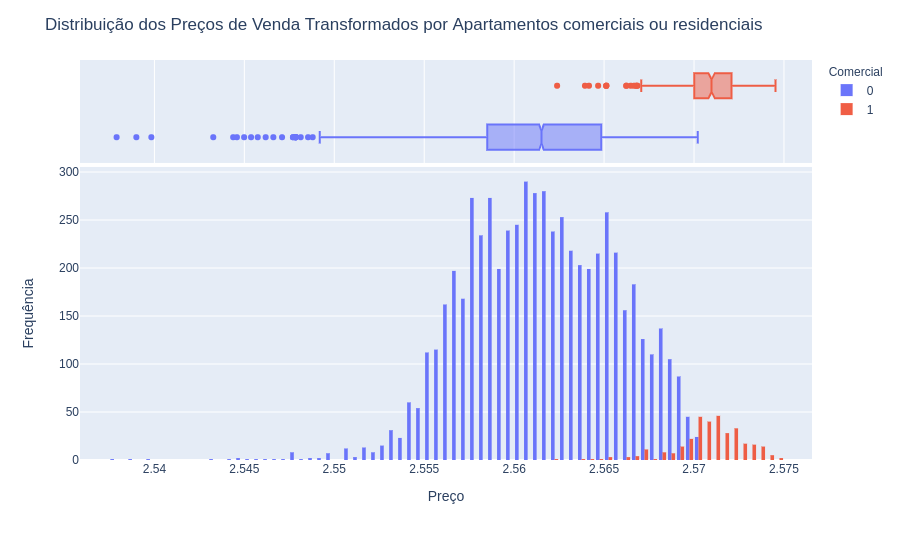

In [40]:
# Distribuição dos preços dos apartamentos divididos pelos apartamentos residenciais e comerciais
fig = px.histogram(sale, 
                   x='Price_Box', 
                   color='Comercial', 
                   marginal='box', 
                   barmode='group',
                   nbins=75)

# Define o layout
fig.update_traces(opacity=0.95)
fig.update_layout(title='Distribuição dos Preços de Venda Transformados por Apartamentos comerciais ou residenciais',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Os gráficos assim indicam que os apartamentos que tem como finalidade **o uso comercial tendem a terem um preço maior de aluguel do que aqueles para fins comerciais**, também é possível notar que os mesmo são ofertados a uma quantidade menor do que os para uso residênciais.

Para os atributos `District` e `Zone` vamos realizar uma plotagem separada por conta de possuirem mais de dois valores unicos sendo que existe **96 bairros**, separados por **5 regiões diferentes**. 

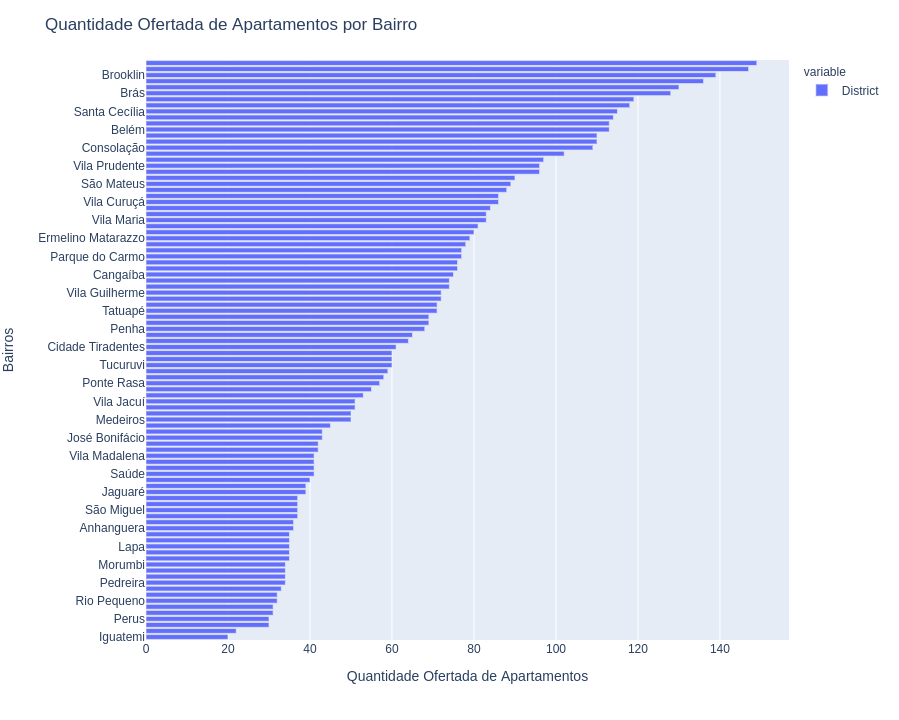

In [41]:
# Quantidade Ofertada de Apartamentos por Bairro em São Paulo
fig = sale['District'].value_counts().sort_values(ascending=True).plot(kind='barh')

# Define o layout
fig.update_layout(title='Quantidade Ofertada de Apartamentos por Bairro',
                  xaxis_title="Quantidade Ofertada de Apartamentos",
                  yaxis_title="Bairros",
                  width=900,
                  height=720)

# Mostra o gráfico
fig.show()

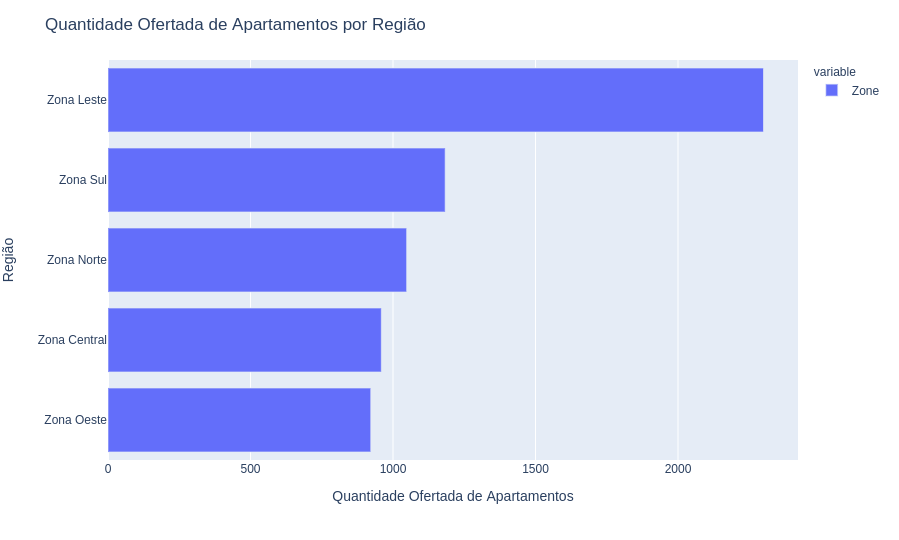

In [42]:
# Quantidade Ofertada de Apartamentos por Região em São Paulo
fig = sale['Zone'].value_counts().sort_values(ascending=True).plot(kind='barh')

# Define o layout
fig.update_layout(title='Quantidade Ofertada de Apartamentos por Região',
                  xaxis_title="Quantidade Ofertada de Apartamentos",
                  yaxis_title="Região",
                  width=900,
                  height=540)

# Mostra o gráfico
fig.show()

O bairro com a maior quantidade de imóveis para a venda do dataset é a **Casa Verde** enquanto a região com a maior quantidade de imóveis é a **Zona Leste**. 

Observar a quantidade total de imóveis disponíveis para venda por bairros ou a quantidade de total de imóveis disponíveis para aluguél por região da cidade é muito interessante porém seria mais informativo se observasse-mós os **valores médio de preço para cada bairro e região diferente**. Os blocos de código a seguir nos informam isso.

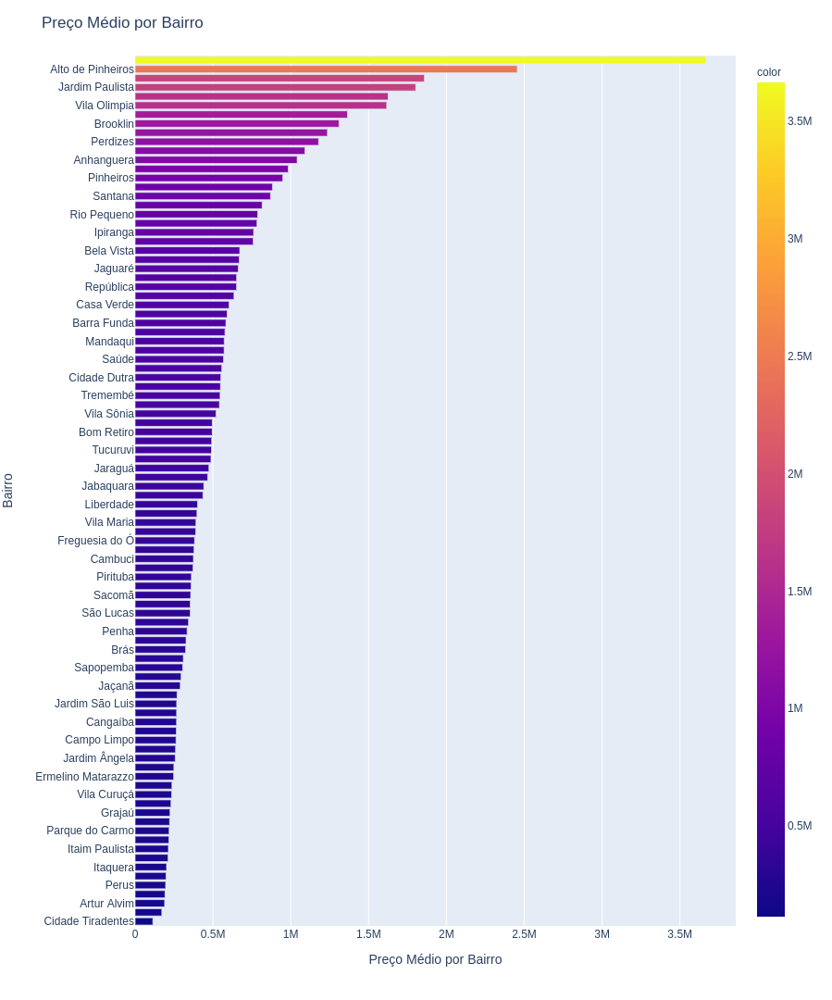

In [43]:
# Média de preços por bairros
fig = px.bar(x=sale.groupby('District')['Price'].mean().sort_values(),
             y=sale.groupby('District')['Price'].mean().sort_values().index, 
             color=sale.groupby('District')['Price'].mean().sort_values())

# Define o layout
fig.update_layout(title='Preço Médio por Bairro',
                  xaxis_title="Preço Médio por Bairro",
                  yaxis_title="Bairro",
                  width=900, 
                  height=1080)

# Mostra o gráfico
fig.show()

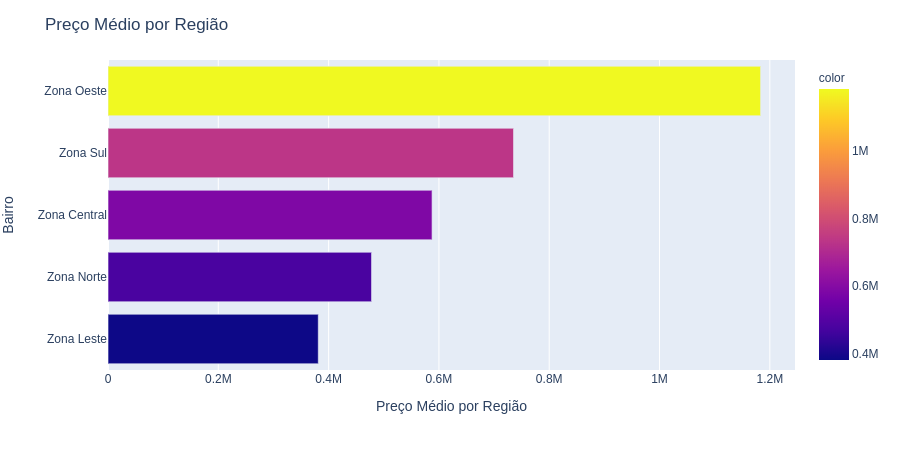

In [44]:
# Média de preços por região
fig = px.bar(x=sale.groupby('Zone')['Price'].mean().sort_values(),
             y=sale.groupby('Zone')['Price'].mean().sort_values().index, 
             color=sale.groupby('Zone')['Price'].mean().sort_values())

# Define o layout
fig.update_layout(title='Preço Médio por Região',
                  xaxis_title='Preço Médio por Região',
                  yaxis_title='Bairro')

# Mostra o gráfico
fig.show()

Quanto ao preço médio por bairro, o bairro com o valor de aluguel **mais elevado é o Iguatemi** localizado próximo ao centro financeiro da cidade na **região oeste da cidade** que também conta com o **maior valor médio de aluguel**. O **Cidade Tiradentes** é o bairro com o menor valor médio de aluguel localizado na zona leste da cidade, enquanto o a região **mais barata é a zona norte**.

Como a média pode conter certo viés quanto ao preço de cada região vamos aprofundar a análise a fim de descobrir mais insights referentes aos preços por região da cidade.

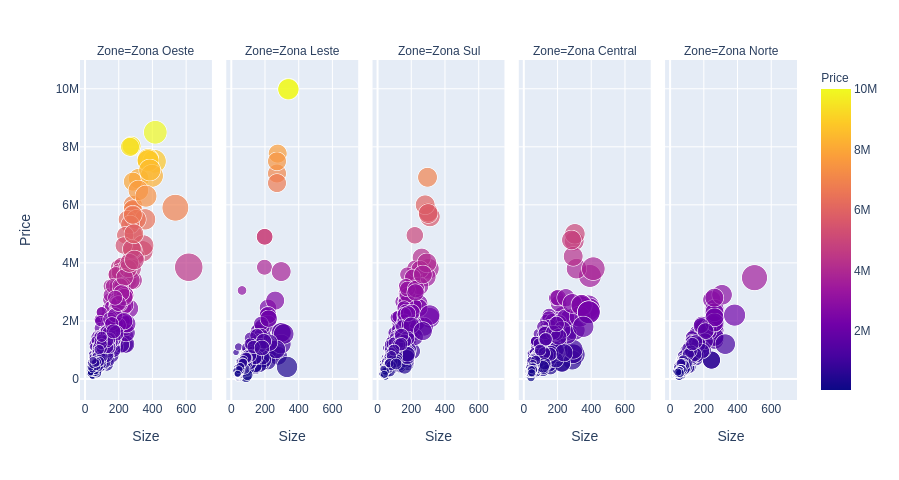

In [45]:
# Scatterplot dos preços de vendas por seu tamanho de cada região da cidade de São Paulo
fig = px.scatter(sale, 
                 x='Size', 
                 y='Price', 
                 color='Price', 
                 size='Size', 
                 facet_col='Zone')

# Define o layout
fig.update_layout(width=900, 
                  height=480)

# Mostra o gráfico
fig.show()

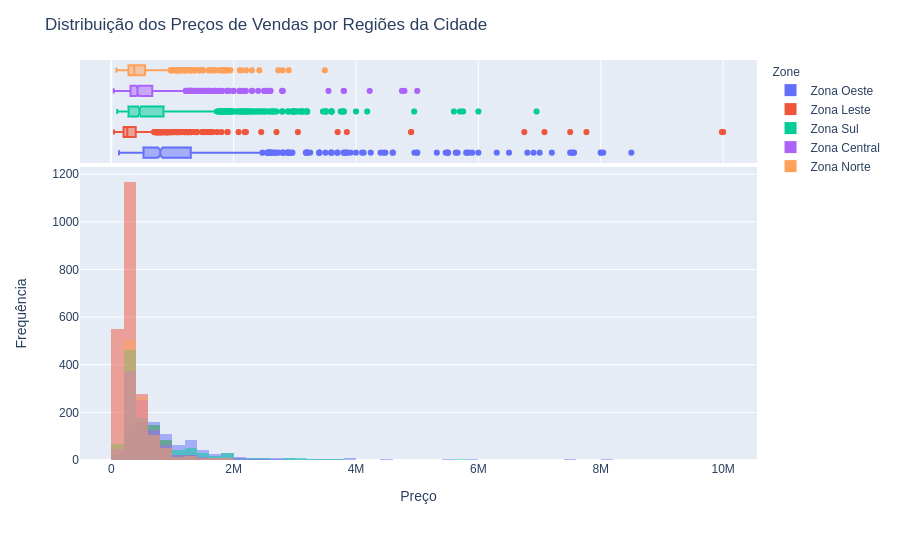

In [46]:
# Distribuição dos preços dos apartamentos segmentados por bairros
fig = px.histogram(sale, 
                   x='Price', 
                   color='Zone', 
                   marginal='box', 
                   barmode='overlay',
                   nbins=75)

# Define o layout
fig.update_traces(opacity=1)
fig.update_layout(title='Distribuição dos Preços de Vendas por Regiões da Cidade',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

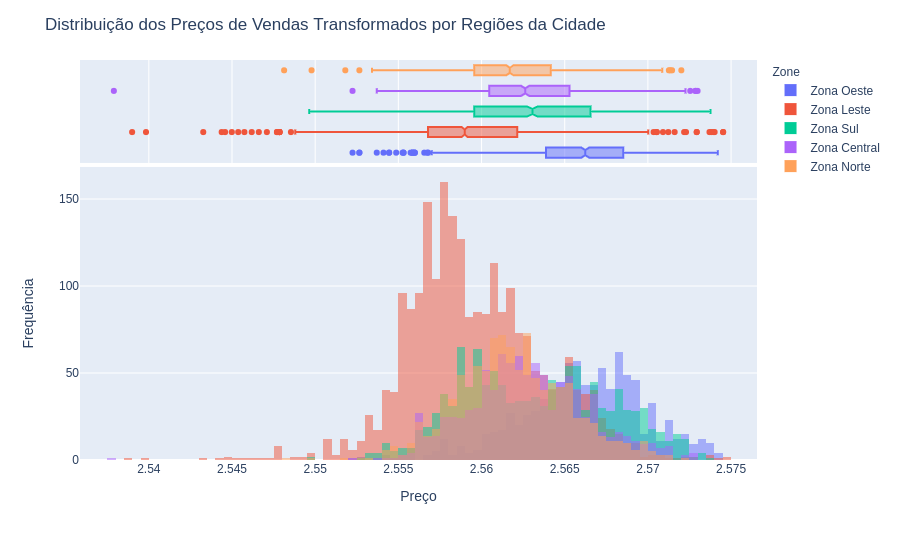

In [47]:
# Distribuição dos preços dos apartamentos segmentados por região da cidade
fig = px.histogram(sale, 
                   x='Price_Box', 
                   color='Zone', 
                   marginal='box', 
                   barmode='overlay',
                   nbins=75)

# Define o layout
fig.update_traces(opacity=1)
fig.update_layout(title='Distribuição dos Preços de Vendas Transformados por Regiões da Cidade',
                  xaxis_title='Preço',
                  yaxis_title='Frequência',
                  width=900, 
                  height=540)

# Mostra o gráfico
fig.show()

Pelos gráficos acima podemos ver que os imóeveis da **Zona Leste, Zona Norte e Região Central** da cidade de São Paulo tendem a possuirem menores preços de venda além de serem menores em tamanho. Já os imóveis da **Zona Sul e Zona Oeste** posuem o são maiores tanto em preços quanto em tamanho.

Feita a análise nos atributos categóricos, vamos agora realizar a análise exploratória para as variáveis quantitativas do nosso dataset. De início vamos checar algumas medidas de tendência central dos dados para que entender melhor estas variáveis.

In [48]:
# Seleciona os atributos categóricos
quant_vars = ['Condo', 'Size', 'Rooms', 'Toilets', 'Suites', 'Parking']

In [49]:
# Resumo estatístico das variáveis quantitativas
sale[quant_vars].describe()

,Condo,Size,Rooms,Toilets,Suites,Parking
count,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000
mean,537.349813,78.611042,2.320805,2.037742,0.931535,1.326575
std,624.632473,50.872359,0.714743,0.917844,0.772615,0.751658
min,0.000000,30.000000,1.000000,1.000000,0.000000,0.000000
25%,150.000000,50.000000,2.000000,2.000000,1.000000,1.000000
50%,400.000000,62.000000,2.000000,2.000000,1.000000,1.000000
75%,700.000000,87.000000,3.000000,2.000000,1.000000,2.000000
max,8920.000000,620.000000,6.000000,7.000000,6.000000,7.000000


Vamos criar novas variaveis com as variáveis quantitativas já existentes para ver só com elas podemos descobrir novos insights ou talvez trazer uma melhor performace para o modelo.

In [50]:
# Criando novas variáveis
# Valor do metro quadrado por apartamento
sale['m2_Value'] = (sale['Price'] + sale['Condo']) / sale['Size']

# Raíz quadrada do tamanho do apartamento
sale['Size_Sqrt'] = sale['Size'].apply(sqrt)

# Número de quartos ao quadrado
sale['Rooms_Square'] = sale['Rooms'] * sale['Rooms']

Antes mesmo de analisar essas novas variáveis vamos explicar essas operações

* **"m2_Value"** é o valor real do metro quadrado de cada apartamento para venda
* **"Size_Sqrt"** diminuirá a separação entre casa grande e casa pequena. O proprietário pode não estar exatamente duas vezes mais feliz por ter uma casa duas vezes maior.
* **"Rooms_Square** aumentam a separação entre não muitos quartos (ex: 1) e muitos quartos (ex: 4) desde 1 ^ 2 = 1, mas 4 ^ 2 = 16. Consequentemente, essa variável afeta principalmente casas com muitos quartos.

In [51]:
# Seleciona os atributos categóricos
quant = ['Condo', 'Size', 'Rooms', 
         'Toilets', 'Suites', 'Parking', 
         'm2_Value', 'Size_Sqrt', 'Rooms_Square']

# Resumo estatístico das variáveis quantitativas
sale[quant].describe()

,Condo,Size,Rooms,Toilets,Suites,Parking,m2_Value,Size_Sqrt,Rooms_Square
count,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000
mean,537.349813,78.611042,2.320805,2.037742,0.931535,1.326575,6898.076395,8.553266,5.896912
std,624.632473,50.872359,0.714743,0.917844,0.772615,0.751658,3184.363491,2.335280,3.573479
min,0.000000,30.000000,1.000000,1.000000,0.000000,0.000000,755.555556,5.477226,1.000000
25%,150.000000,50.000000,2.000000,2.000000,1.000000,1.000000,4795.784574,7.071068,4.000000
50%,400.000000,62.000000,2.000000,2.000000,1.000000,1.000000,6152.369787,7.874008,4.000000
75%,700.000000,87.000000,3.000000,2.000000,1.000000,2.000000,8121.202830,9.327379,9.000000
max,8920.000000,620.000000,6.000000,7.000000,6.000000,7.000000,46212.166667,24.899799,36.000000


Vamos visualizar as relações das variáveis quantitativas umas com as outras através de um *pairplot*. Desta vez o plotly não poderá nos auxíliar pois o método similar ao *pairplot* da biblioteca seaborn para o plotly (*scatterplot_matrix*) não é muito bom para grande quantidade de dados e grande quantidade de colunas, com essas condições este método é capaz de travar o kernel do notebook. 

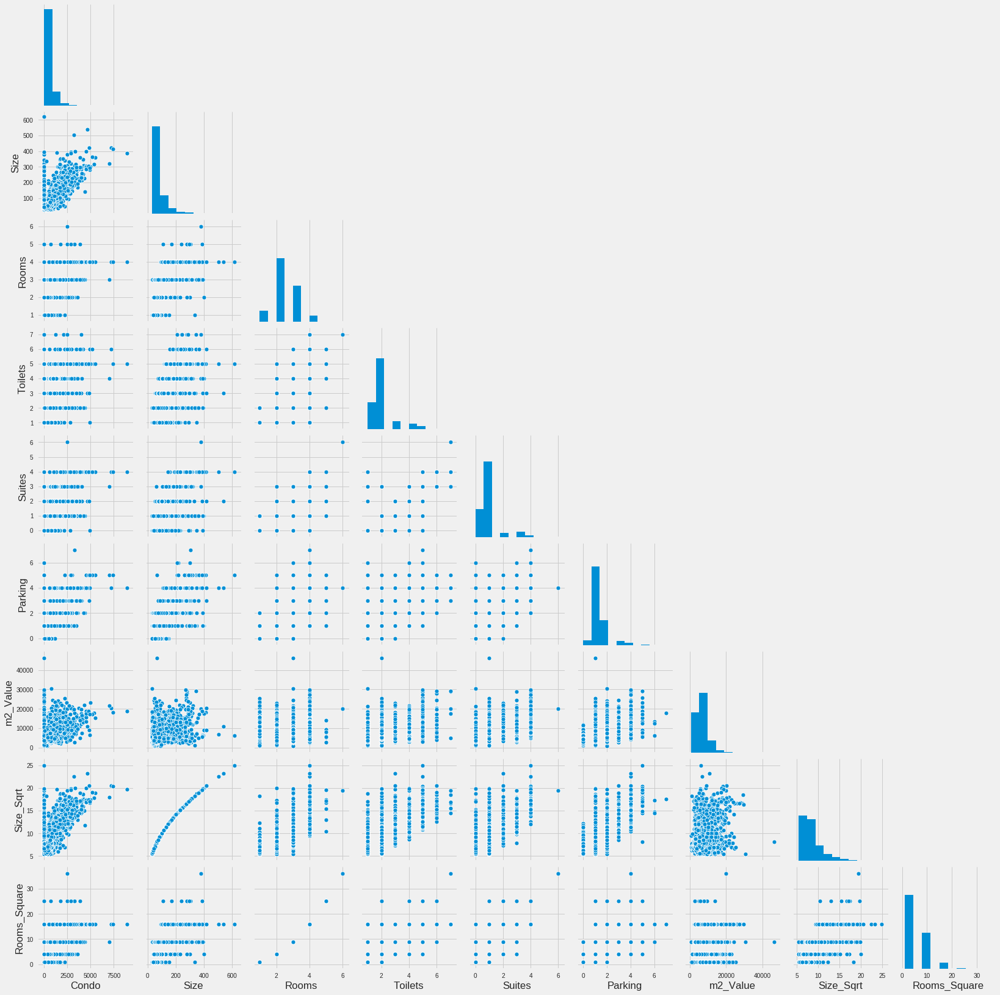

In [52]:
# Visualizando as relações entre as variáveis quantitativas através de gráfico dispersão
sns.pairplot(sale, 
             vars=sale[quant], 
             diag_kind='hist', 
             corner=True)

# Mostra o gráfico
plt.show()

Mesmo podendo ver a existência de algumas relações por meio pairplot, estas relações não parecem ser tão nítidas por conta que quatro das nossas variáveis quantitativas são do tipo **quantitativas discretas** ou seja posuem valores contaveis. Para poder entende-lás melhor vamos vizualizar as suas distribuições separadamente. 

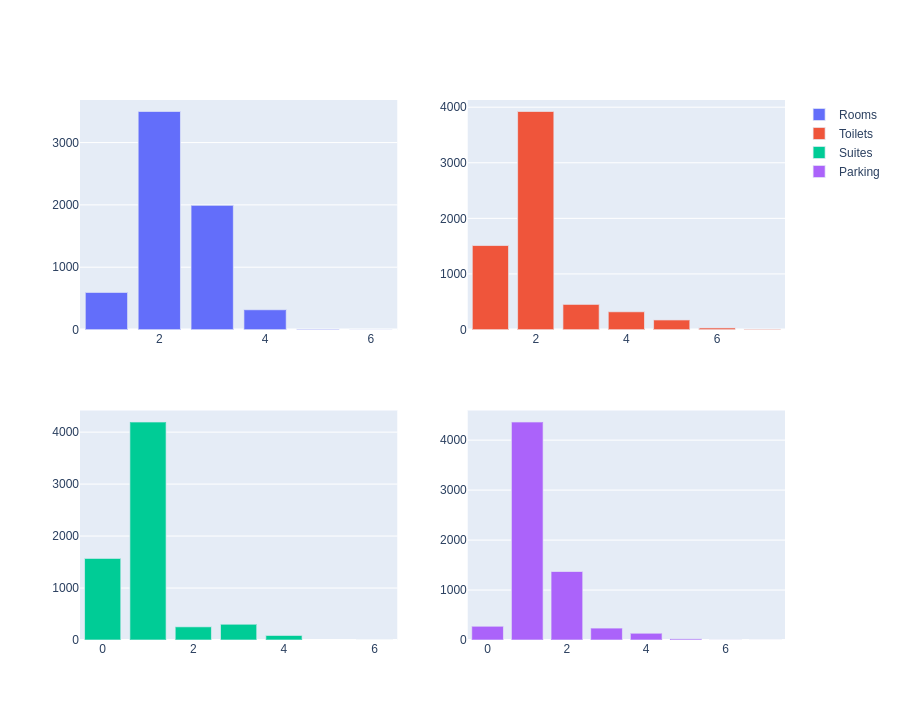

In [53]:
# Criando os subplots
fig = make_subplots(rows=2, cols=2)

# Cria os gráficos de barras
fig.add_trace(go.Bar(x=sale['Rooms'].value_counts().index, 
                     y=sale['Rooms'].value_counts(), name='Rooms'), 1, 1)

fig.add_trace(go.Bar(x=sale['Toilets'].value_counts().index, 
                     y=sale['Toilets'].value_counts(), name='Toilets'), 1, 2)

fig.add_trace(go.Bar(x=sale['Suites'].value_counts().index, 
                     y=sale['Suites'].value_counts(), name='Suites'), 2, 1)

fig.add_trace(go.Bar(x=sale['Parking'].value_counts().index, 
                     y=sale['Parking'].value_counts(), name='Parking'), 2, 2)

fig.update_layout(width=900, 
                  height=720)

# Mostra os gráficos
fig.show()

Com base nos gráficos das variáveis quantitativas discretas podemos ver que a distribuições se assemelham à **distribuições Poison** sendo que elas aparentam ter a presença de alguns outliers. Para podermos ter a certeza disso vamos ver os gráficos de violin delas e das outras demais variáveis quantitativas. 

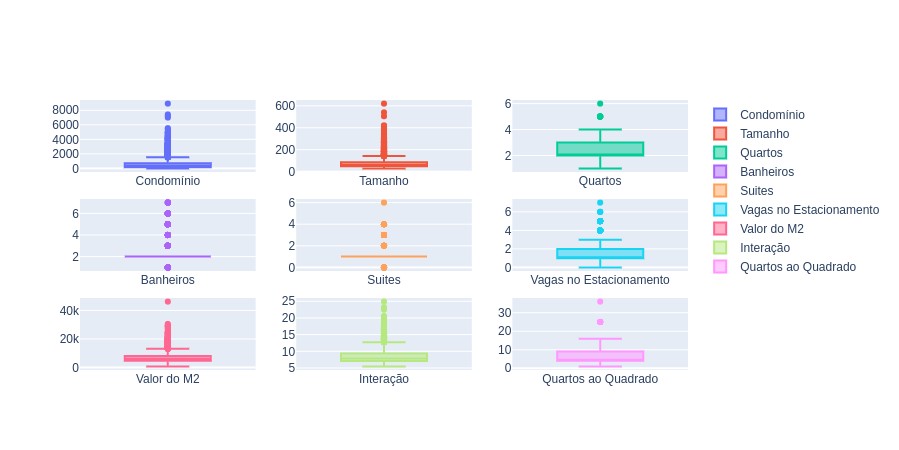

In [54]:
# Checando os outliers por meio do Boxplot e violin plot

# Criando os subplots
fig = make_subplots(rows=3, cols=3)

# Violin plot das taxa de condomínio
fig.add_trace(go.Box(y=sale['Condo'], name='Condomínio'), row=1, col=1)

# Violin plot do tamanho dos apartamentos
fig.add_trace(go.Box(y=sale['Size'], name='Tamanho'), row=1, col=2)

# Violin plot da quantidade de quartos
fig.add_trace(go.Box(y=sale['Rooms'], name='Quartos'), row=1, col=3)

# Violin plot da quantidade de banheiros
fig.add_trace(go.Box(y=sale['Toilets'], name='Banheiros'), row=2, col=1)

# Violin plot da quantidade de Suites
fig.add_trace(go.Box(y=sale['Suites'], name='Suites'), row=2, col=2)

# Violin plot da quantidade de vagas no estacionamento
fig.add_trace(go.Box(y=sale['Parking'], name='Vagas no Estacionamento'), row=2, col=3)

# Violin plot da quantidade de banheiros
fig.add_trace(go.Box(y=sale['m2_Value'], name='Valor do M2'), row=3, col=1)

# Violin plot da quantidade de Suites
fig.add_trace(go.Box(y=sale['Size_Sqrt'], name='Interação'), row=3, col=2)

# Violin plot da quantidade de vagas no estacionamento
fig.add_trace(go.Box(y=sale['Rooms_Square'], name='Quartos ao Quadrado'), row=3, col=3)

# Mostra os gráficos
fig.show()

Dando prosseguimento na análise exploratória dos dados quantitativos porém, agora fim descobrir possíveis relacionamentos entre as variáveis quantitativas vamos olhar as correlações entre os atributos através de de uma matriz de correlação.

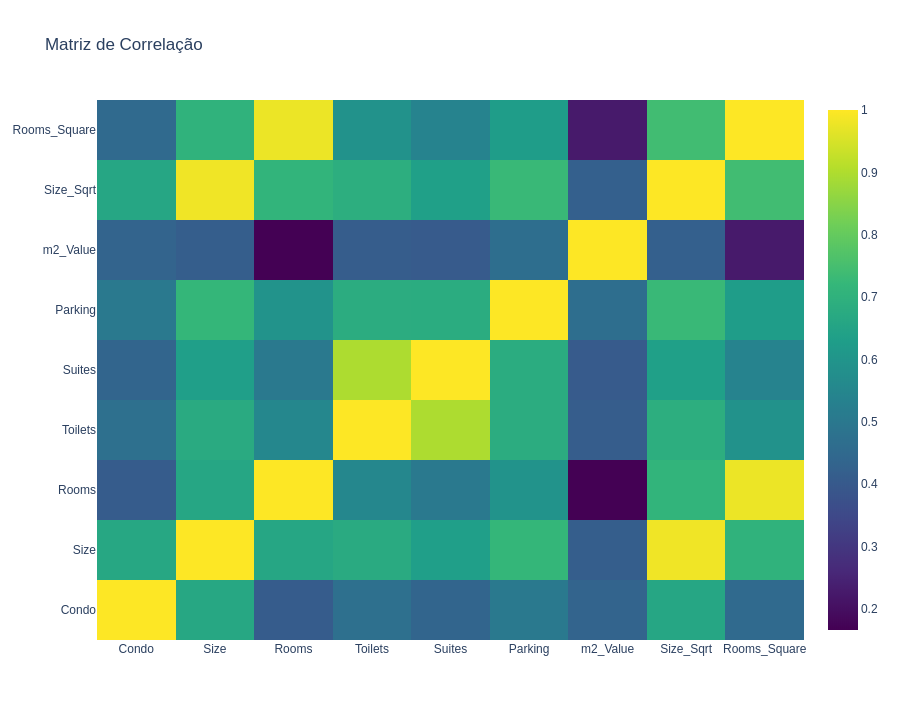

In [55]:
# Correlação entre as variáveis quantitativas
corr = sale[quant].corr()

# Obtendo os labels
mat_cols = corr.columns.tolist()

# Convertendo em array
corr_array = np.array(corr)

# Cria a matrix de correlação
fig = go.Heatmap(z=corr_array, 
                 x=mat_cols,
                 y=mat_cols,
                 colorscale='Viridis')

# Gera o layout
layout = go.Layout(dict(title="Matriz de Correlação",
                        autosize=False,
                        height=720,
                        width=800))

# Gera a figura
data = [fig]
fig = go.Figure(data=fig,layout=layout)

# Mostra os gráficos
fig.show()

Por meio da matriz de correlação podemos enxergar que possa ter a existência de multicolineariadade entre as variáveis. Para poder descobrir quais são os atribuitos mais colineares vamos examinar o **VIF (Variance Inflation Factor)**.

O fator de inflação de variância (VIF) é uma medida de colinearidade entre variáveis preditoras em uma regressão múltipla. É calculado considerando a razão da variância de todos os betas de um determinado modelo, dividida pela variane de um único beta, se fosse adequado. Para então poder saber o VIF de cada uma dessas variáveis vamos criar um modelo de regressão linear entre a variável "Price_Box" e todas as demais variáveis quantitativas.

In [56]:
# Cria a Formula utilizada pelo modelo
formula = ('Price_Box ~ Condo + Size + Rooms + Toilets + Suites + Parking + m2_Value + Size_Sqrt + Rooms_Square')

# Instancia e treina um modelo de regressão linear
lm = smf.ols(formula=formula, data=sale).fit()

# Sumário do modelo
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              Price_Box   R-squared:                       0.903
Model:                            OLS   Adj. R-squared:                  0.903
Method:                 Least Squares   F-statistic:                     6596.
Date:                Sat, 27 Jun 2020   Prob (F-statistic):               0.00
Time:                        16:08:52   Log-Likelihood:                 32977.
No. Observations:                6412   AIC:                        -6.593e+04
Df Residuals:                    6402   BIC:                        -6.587e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        2.5349      0.000   1.05e+04   

In [57]:
# Obtém os valores das variáveis
variables = lm.model.exog

# Calcula o VIF
vif = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]

# VIF para as variáveis quantitativas
vif 

[188.2167613174053,
 1.8984266747933494,
 39.63070579736297,
 30.188900314688205,
 5.916258954612017,
 5.414700857042574,
 2.776971810482735,
 1.5472838866588527,
 44.99962666491621,
 30.77110326532789]

Além de alguns dos atributos quantitativos presentes no dataset terem uma correlação muito alta os atributos  possuem um valor do VIF muito alto (acima de 10) indicando a presença de multicolinearidade. 

Porém este problema pode ser contornado com a utilização de um modelo de aprendizado de máquina que sejam **mais robustos** e resolvam esse tipo de problema. Como usaremos modelos baseados em arvores de decisão e os mesmos tendem a não ter esse problema de multicolinearidade pois os mesmos tendem a não escolher os atributos colineares de uma forma inplace.

Agora vamos analisar a assimetria das variáveis quantitativas, primeiro checamos essa medida e logo após plotaremos um *qqplot* desses atributos para verificar se os mesmos possuem uma **distribuição normal** para que possamos aplicar os algoritmos de *machine learning*, pois este é um pré-requisito.

In [58]:
# Checa a assimétria das variáveis.
sale[quant].skew()

Condo           3.372487
Size            2.891723
Rooms           0.351816
Toilets         1.653106
Suites          1.490307
Parking         1.826002
m2_Value        2.177514
Size_Sqrt       1.853212
Rooms_Square    1.260975
dtype: float64

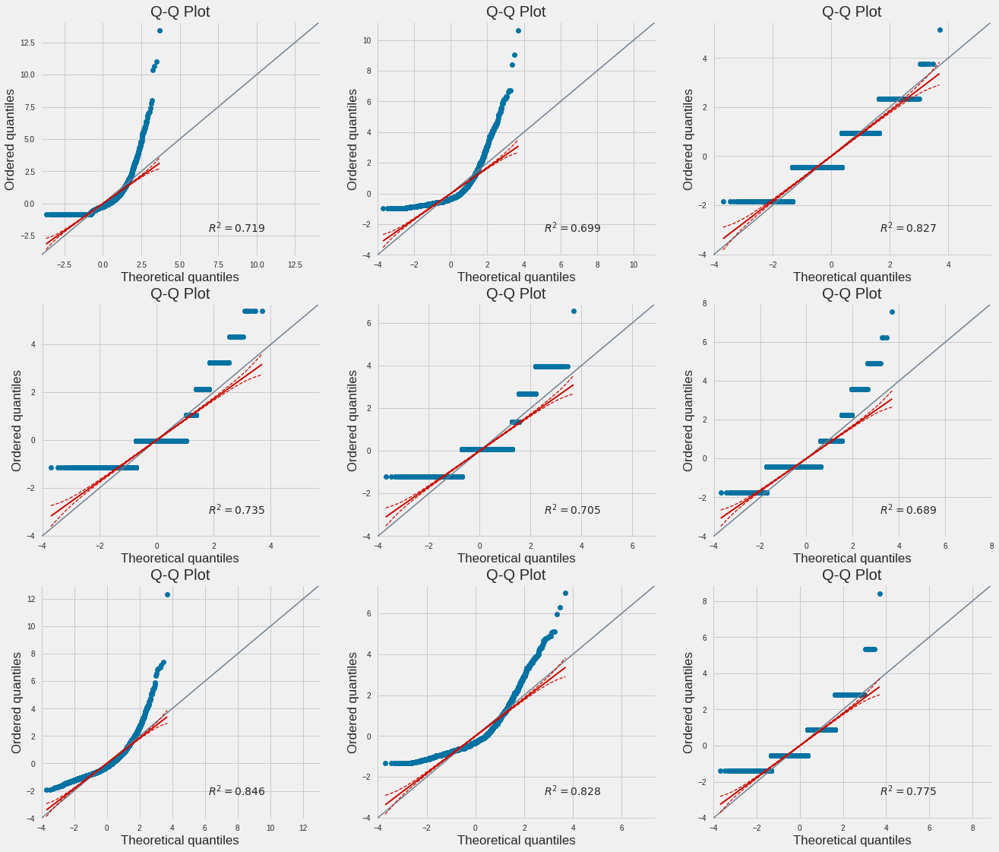

In [59]:
# Cria um Q-Q plot utilizando a biblioteca pingouin
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(20, 18))

ax1 = pg.qqplot(sale['Condo'], dist='norm', ax=ax1)
ax2 = pg.qqplot(sale['Size'], dist='norm', ax=ax2)
ax3 = pg.qqplot(sale['Rooms'], dist='norm', ax=ax3)
ax4 = pg.qqplot(sale['Toilets'], dist='norm', ax=ax4)
ax5 = pg.qqplot(sale['Suites'], dist='norm', ax=ax5)
ax6 = pg.qqplot(sale['Parking'], dist='norm', ax=ax6)
ax7 = pg.qqplot(sale['m2_Value'], dist='norm', ax=ax7)
ax8 = pg.qqplot(sale['Size_Sqrt'], dist='norm', ax=ax8)
ax9 = pg.qqplot(sale['Rooms_Square'], dist='norm', ax=ax9)

# Mostra o gráfico
plt.show()

Podemos ver que nenhum dos atributos tendem a seguir uma distribuição normal e alguns dos atributos não seguem este tipo de distribuição pois são variáveis do tipo quantitativas discretas. Para tentar deixar os dados próximos de uma distribuição gaussiana vamos usar um pipeline com `PowerTransformer` e `MinMaxScaler` para deixar todas as variáveis em um mesmo range de valores.

In [60]:
# Cria um pipeline com powwer_transformer e min_max_scaler
pipeline = Pipeline([('power_transform', PowerTransformer(standardize=False)), 
                     ('min_max_scaler', MinMaxScaler())])

# Realiza as transformações
quant_scaler = pd.DataFrame(pipeline.fit_transform(sale[quant]), 
                            columns=quant)

# Retorna as estatísticas descritivas do dataset
quant_scaler.describe()

,Condo,Size,Rooms,Toilets,Suites,Parking,m2_Value,Size_Sqrt,Rooms_Square
count,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000,6412.000000
mean,0.293649,0.519159,0.325219,0.342992,0.292495,0.419194,0.589264,0.519317,0.335361
std,0.178173,0.193999,0.160207,0.225575,0.193204,0.144826,0.096302,0.195467,0.165920
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.222523,0.390553,0.260595,0.383994,0.345253,0.368893,0.525239,0.389293,0.267512
50%,0.326814,0.509639,0.260595,0.383994,0.345253,0.368893,0.585625,0.509348,0.267512
75%,0.403355,0.656807,0.478772,0.383994,0.345253,0.567387,0.650340,0.658249,0.496272
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [61]:
# Checando a assimétria das variáveis após as transfomações.
quant_scaler.skew()

Condo          -0.342368
Size            0.084594
Rooms           0.002754
Toilets        -0.000930
Suites          0.000952
Parking        -0.033150
m2_Value       -0.018946
Size_Sqrt       0.092166
Rooms_Square    0.000088
dtype: float64

Para finalizar vamos checar a nova forma da distribuição das variáveis quantitativas por meio dos seus respectivos Q-Q Plots.

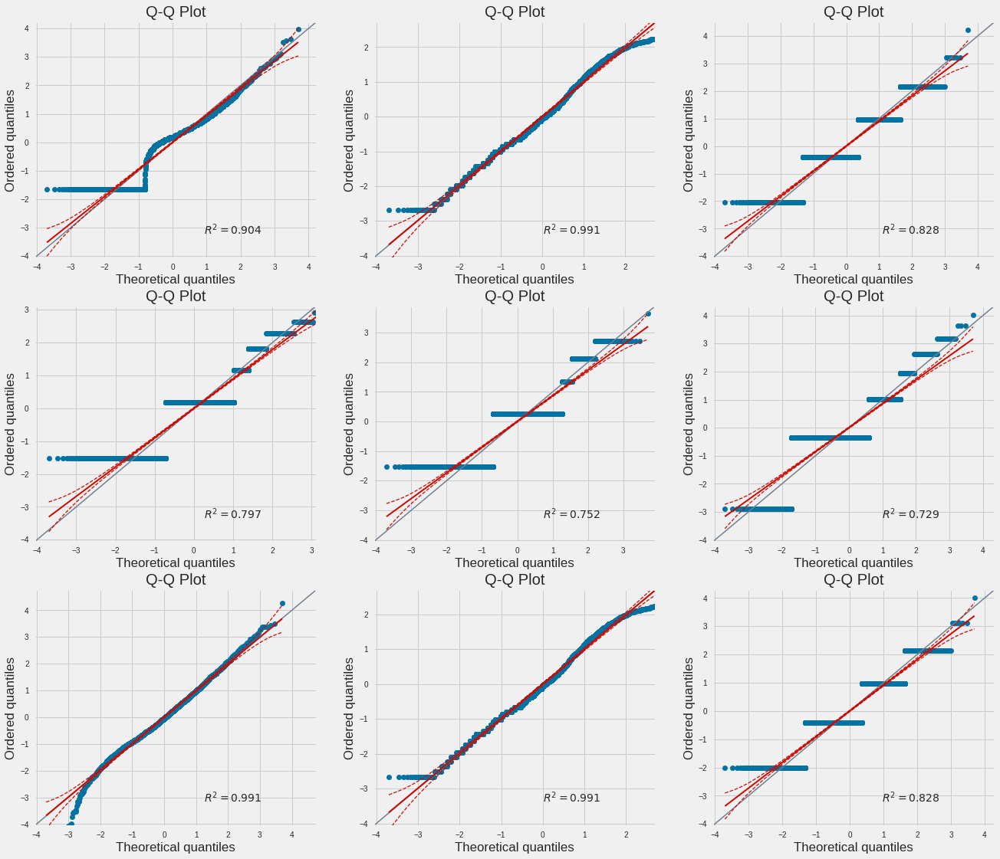

In [62]:
# Cria um Q-Q plot utilizando a biblioteca pingouin
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(20, 18))

ax1 = pg.qqplot(quant_scaler['Condo'], dist='norm', ax=ax1)
ax2 = pg.qqplot(quant_scaler['Size'], dist='norm', ax=ax2)
ax3 = pg.qqplot(quant_scaler['Rooms'], dist='norm', ax=ax3)
ax4 = pg.qqplot(quant_scaler['Toilets'], dist='norm', ax=ax4)
ax5 = pg.qqplot(quant_scaler['Suites'], dist='norm', ax=ax5)
ax6 = pg.qqplot(quant_scaler['Parking'], dist='norm', ax=ax6)
ax7 = pg.qqplot(quant_scaler['m2_Value'], dist='norm', ax=ax7)
ax8 = pg.qqplot(quant_scaler['Size_Sqrt'], dist='norm', ax=ax8)
ax9 = pg.qqplot(quant_scaler['Rooms_Square'], dist='norm', ax=ax9)

# Mostra o gráfico
plt.show()

Para finalizar todas as tranformações no conjunto de dados vamos criar variáveis dummies com a função `.get_dummies` do pandas.

In [63]:
# Seleciona os atributos categóricos
cat_vars = ['Elevator', 'Furnished', 'Swimming_Pool', 'Comercial', 'Zone']

# Aplica a função .get_dummies do pandas
dummies = pd.get_dummies(sale[cat_vars])

# Checa os novos atributos dos dados
dummies.head()

,Comercial,Elevator_0,Elevator_1,Furnished_0,Furnished_1,Swimming_Pool_0,Swimming_Pool_1,Zone_Zona Central,Zone_Zona Leste,Zone_Zona Norte,Zone_Zona Oeste,Zone_Zona Sul
0,0,0,1,1,0,0,1,0,0,0,1,0
1,0,0,1,0,1,0,1,0,0,0,1,0
2,0,0,1,1,0,0,1,0,0,0,1,0
3,0,0,1,1,0,0,1,0,0,0,1,0
4,0,1,0,0,1,0,1,0,0,0,1,0


Tudo pronto agora podemos concatenar dos dataset para poder dividi-los em treino e teste assim criar treinar os primeiros modelos.

In [64]:
# Junta os dataset em um lista
frames = [quant_scaler, dummies, sale['Price']]

# Concatena os datasets em um único
df = pd.concat(frames, axis=1)

# Checa o novo dataset
df.head()

,Condo,Size,Rooms,Toilets,Suites,Parking,m2_Value,Size_Sqrt,Rooms_Square,Comercial,...,Furnished_0,Furnished_1,Swimming_Pool_0,Swimming_Pool_1,Zone_Zona Central,Zone_Zona Leste,Zone_Zona Norte,Zone_Zona Oeste,Zone_Zona Sul,Price
0,0.460048,0.591996,0.000000,0.383994,0.345253,0.567387,0.695197,0.592632,0.000000,0,...,1,0,0,1,0,0,0,1,0,732600
1,0.630994,0.836928,0.670007,0.855746,0.552754,0.701004,0.739580,0.840117,0.688520,0,...,0,1,0,1,0,0,0,1,0,1990000
2,0.403355,0.567505,0.260595,0.383994,0.345253,0.368893,0.703556,0.567849,0.267512,0,...,1,0,0,1,0,0,0,1,0,720000
3,0.543218,0.824720,0.478772,0.855746,0.702516,0.567387,0.715044,0.827862,0.496272,0,...,1,0,0,1,0,0,0,1,0,1680000
4,0.442602,0.456093,0.260595,0.383994,0.345253,0.567387,0.856714,0.455302,0.267512,0,...,0,1,0,1,0,0,0,1,0,1200000


In [65]:
# Seleciona os atributos e a variável alvo para a divisão
X = df.drop('Price', axis=1)
y = df['Price']

# Divisão em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [66]:
# Cria uma função com as métricas de avaliação
def performace(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    return (print('MSE das previsões é {}'.format(round(mse, 2))+
                  '\nRMSE das previsões é {}'.format(round(np.sqrt(mse), 2))+
                  '\nMAE das previsões é {}'.format(round(mae, 2))))

Para seleção dos modelos vamos criar uma lista contendo 9 modelos sendo dois modelos lineares mais simples **LASSO** e **Ridge** além de modelos lineares mais robustos a outliers nos dados, **HuberRegressor**, e **TheilSenRegressor**, também nesse conjunto de dados será testado uma **DecisionTree** e três métodos ensenbles diferentes, sendo eles, **RandomForestRegressor** **XGBoostRegressor** e **LGBMRegressor**. 

Após ambos treinados seus socres de validação cruzda serão armazenados em uma lista para poderem serem plotados seus resultados em um box-plot.

Lasso Regression: -121567874197.828857 (53841813750.706718)
Ridge Regression: -121806703460.006348 (54403284333.845276)
Hubber Regression: -178442066524.708740 (93505980484.077682)
Theil-Sen Estimator: -167660880701.256653 (91444466874.869431)
Decision Tree Regressor: -10110579323.872862 (5528785447.167610)
Random Forest Regressor: -5606086642.338053 (4566818071.492244)
XGBoost Regressor: -4114053546.735303 (3687301023.059726)
Light Gradient Boosting Regressor: -9287307526.349112 (7487699924.462482)


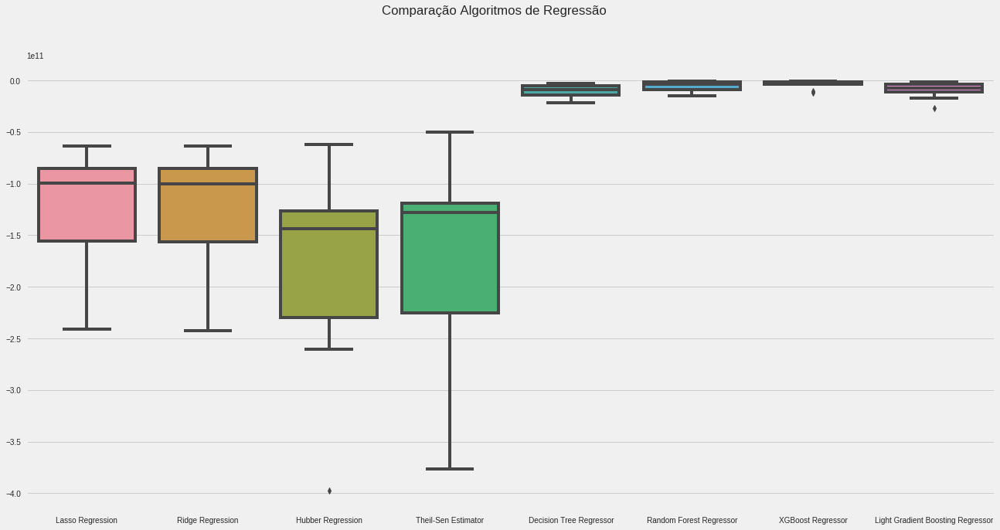

In [67]:
# Instanciando e criando uma lista com os modelos
modelos = []
modelos.append(('Lasso Regression', Lasso(random_state=42)))
modelos.append(('Ridge Regression', Ridge(random_state=42)))
modelos.append(('Hubber Regression', HuberRegressor()))
modelos.append(('Theil-Sen Estimator', TheilSenRegressor(random_state=42)))
modelos.append(('Decision Tree Regressor', DecisionTreeRegressor(random_state=42)))
modelos.append(('Random Forest Regressor', RandomForestRegressor(random_state=42)))
modelos.append(('XGBoost Regressor', XGBRegressor(random_state=42)))
modelos.append(('Light Gradient Boosting Regressor', LGBMRegressor(random_state=42)))

# Lista de resultados e nomes dos modelos
resultados = []
nomes = []

# Seleção do melhor modelo por meio de uma validação cruzada
for nome, modelo in modelos:
    kfold = KFold(n_splits=10, random_state=42)
    cv_results = cross_val_score(modelo, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')
    resultados.append(cv_results)
    nomes.append(nome)
    msg = '%s: %f (%f)' % (nome, cv_results.mean(), cv_results.std())
    print(msg)

# Box-plot dos modelos
fig = plt.figure(figsize=(20, 10))
fig.suptitle('Comparação Algoritmos de Regressão')
ax = fig.add_subplot(111)
sns.boxplot(x=nomes, y=resultados)
ax.set_xticklabels(nomes)
plt.show()

O XGBoost Regressor foi o modelo que teve **o menor MSE (erro quadrado médio)** para os dados de treino **-4114053546.73** além de possuir o menor desvio padrão **3687301023.05**. Para poder dar sequência na análise vamos selecionar este modelo e fazer as primeiras previsões e depois otimiza-lo para poder obter um menor erro.

In [68]:
# Instancia do XGBoost Regressor
xgboost = XGBRegressor(random_state=42)

# Treina o modelo
xgboost.fit(X_train, y_train)

# Armazena as previsões em uma variável
pred = xgboost.predict(X_test)

# Realiza a avalição por meio da função perfomace
performace(y_test, pred)

MSE das previsões é 3064072816.23
RMSE das previsões é 55354.07
MAE das previsões é 15495.92


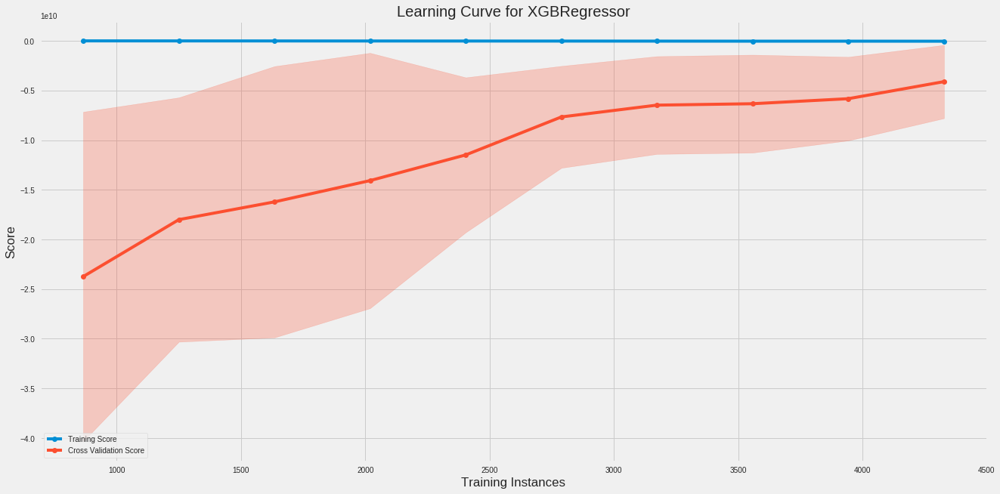

In [69]:
# Cria a divisão dos dados
cv = KFold(n_splits=10)
sizes = np.linspace(0.2, 1.0, 10)

# Instanciando o modelo de Regressão e o visualizador
visualizer = LearningCurve(xgboost, 
                           cv=cv, 
                           scoring='neg_mean_squared_error', 
                           train_sizes=sizes, 
                           n_jobs=4)

# Ajuste os dados de treinamento ao visualizador
visualizer.fit(X_train, y_train)

# Plota os scores da validação cruzada
visualizer.show()

Uma curva de aprendizado mostra a relação da pontuação do treinamento versus a pontuação do teste da validação cruzada para um estimador com um número variável de amostras de treinamento.

Se as pontuações de treinamento e validação cruzada convergirem à medida que mais dados forem adicionados, o modelo provavelmente não se beneficiará de mais dados. Se a pontuação do treinamento for muito maior que a pontuação da validação, o modelo provavelmente precisará de mais exemplos de treinamento para generalizar com mais eficiência.

Em nossa curva de aprendizado mostra pouca variabilidade, o modelo começa a **convergir para um MSE score de cerca de -470000**. Podemos ver que as pontuações de treinamento e teste ainda não convergiram, portanto, **potencialmente esse modelo se beneficiaria com mais dados de treinamento**.

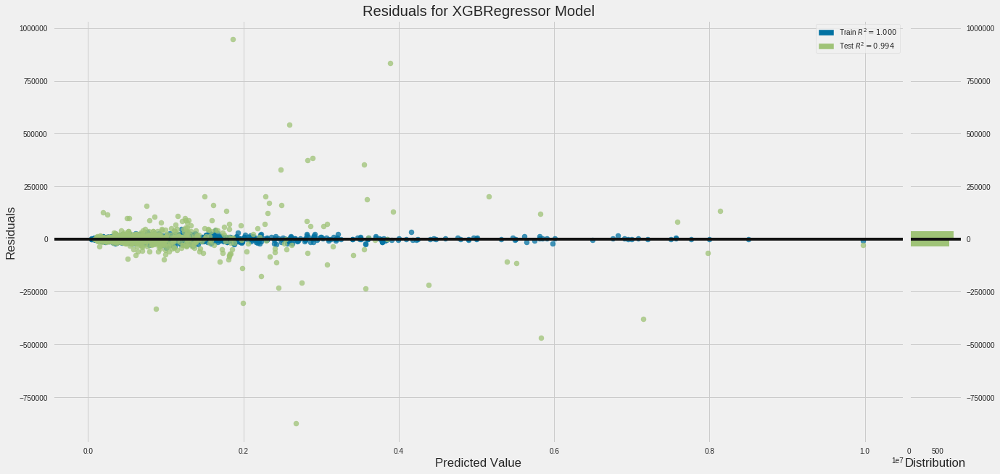

In [70]:
# Instancia o Residual Plot
visualizer = ResidualsPlot(xgboost)

# Ajuste os dados de treinamento ao visualizador
visualizer.fit(X_train, y_train)

# Avalie o modelo nos dados de teste
visualizer.score(X_test, y_test)

# Mostra o gráfico
visualizer.show()

O gráfico acima se chama **Residual Plot (plot dos resíduos)**. Um gráfico de resíduos é um gráfico que mostra os resíduos no eixo vertical e a valor previsto no eixo horizontal. 

Se os pontos em um gráfico residual são aleatoriamente dispersos em torno do eixo horizontal, um modelo de regressão linear é apropriado para os dados, caso contrário, um modelo não linear é mais apropriado. Por meio deste tipo de gráfico é permitindo detectar regiões no destino que podem ser suscetíveis a mais ou menos erros.

Como em nossos dados durante o pré-processamento foi aplicado um `MinMaxScaler` para que os dados ficassem no mesmo range de valores dos atributos categóricos podemos ver uma maior concentração dos dados próximos a linha escura. Também é possível enxegar erros bem distanciados do centro, esse são outliers que o modelo não conseguiu prever corretamente.

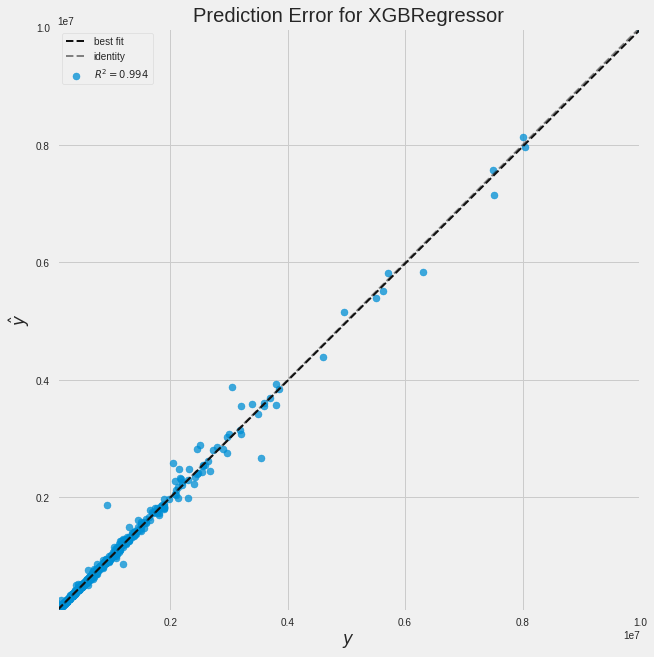

In [71]:
# Instancia o Residual Plot
visualizer = PredictionError(xgboost)

# Ajuste os dados de treinamento ao visualizador
visualizer.fit(X_train, y_train)

# Avalie o modelo nos dados de teste
visualizer.score(X_test, y_test)

# Mostra o gráfico
visualizer.show() 

O gráfico acima trata-se de um **Prediction Error Plot (gráfico de erro de previsão)** mostra os destinos reais do conjunto de dados em relação aos valores previstos gerados pelo nosso modelo. Isso nos permite ver quanta variação há no modelo. 

Como diagnostico deste modelo de regressão podemos ver que esse gráfico comparando com a linha de 45 graus, onde a previsão corresponde exatamente ao modelo, podemos ver que para um primeiro modelo este esta muito bem ajustado podendo ate ser um sinal de overfiting.

Já podemos perceber que o nosso modelo sem qualquer ajuste tem bons resultados, porém, podemos melhora-lo através de tunning dos seus hiperparâmetros. Como o XGBoost Regressor possui muitos hiperparâmetros o **GridSearch se torna impraticavel**, então para realizar o tunning vamos utilizar **Otimização Bayessiana usando Processos Gaussianos**.

Como o XGBoost Regressor é uma função de **caixa preta**, sem forma fechada nem gradientes, a idéia é **aproximar a função usando um processo gaussiano**. Em outras palavras, supõe-se que os valores das funções sigam um processo gaussiano multivariado. A covariância dos valores das funções é dada por um kernel GP entre os parâmetros.

Em seguida, uma escolha inteligente para escolher o próximo parâmetro a ser avaliado pode ser feita pela função de aquisição a priori gaussiano, que é muito mais rápida de avaliar.

In [72]:
# Instancia o XGBRegressor
xgboost_reg = XGBRegressor(random_state=42)

# A lista de hiperparâmetros que queremos otimizar. 
space  = [Real(1e-5, 1e-1, 'log-uniform', name='eta'),
          Integer(200, 2000, name='n_estimators'),
          Integer(10, 200, name= 'max_depth'),
          Integer(1, 10, name='min_child_weight'),
          Real(0.05, 1.0, name='subsample'),
          Real(0.1, 1.0, name='colsample_bytree'),
          Real(0.1, 10, name='reg_alpha'),
          Real(0.1, 10, name='reg_lambda')]

# permite que sua função objetivo receba os parâmetros como argumentos de palavras-chave.
@use_named_args(space)
def objective(**params):
    xgboost_reg.set_params(**params)

    return -np.mean(cross_val_score(xgboost_reg, 
                                    X_train, 
                                    y_train, 
                                    cv=10, 
                                    n_jobs=-1, 
                                    scoring="neg_mean_squared_error"))

In [73]:
xgboost_gp = gp_minimize(objective,          # Função a ser minimizada
                         space,              # Espaços dos hiperparâmetros a ser otimizado
                         n_calls=50,         # Número de rodadas para otimização
                         n_random_starts=10, # Número de avaliações de pontos aleatórios antes de aproximar a função.
                         random_state=42, 
                         verbose=1)

Iteration No: 1 started. Evaluating function at random point.
Iteration No: 1 ended. Evaluation done at random point.
Time taken: 12.8189
Function value obtained: 41535044210.4062
Current minimum: 41535044210.4062
Iteration No: 2 started. Evaluating function at random point.
Iteration No: 2 ended. Evaluation done at random point.
Time taken: 16.1822
Function value obtained: 864579179890.2623
Current minimum: 41535044210.4062
Iteration No: 3 started. Evaluating function at random point.
Iteration No: 3 ended. Evaluation done at random point.
Time taken: 2.2380
Function value obtained: 471376868528.3952
Current minimum: 41535044210.4062
Iteration No: 4 started. Evaluating function at random point.
Iteration No: 4 ended. Evaluation done at random point.
Time taken: 44.4923
Function value obtained: 877521003566.3142
Current minimum: 41535044210.4062
Iteration No: 5 started. Evaluating function at random point.
Iteration No: 5 ended. Evaluation done at random point.
Time taken: 18.3642
Func

Vamos visualizar o caminho percorrido durante a busca feita pelo Processo Gaussiano até a convergência dos melhores hiperparâmetros do modelo.

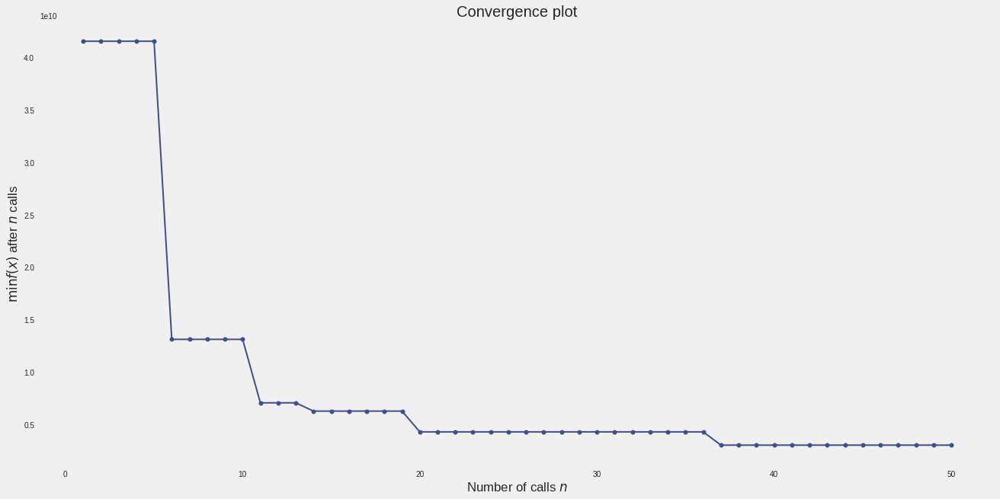

In [74]:
# Plot da convergência do Processo Gaussiano.
plot_convergence(xgboost_gp)
plt.show()

Agora que a otimização já foi feita vamos ver os parâmetros escolhidos durante o processo que minimiza nosso MSE score.

In [75]:
# Hiperparâmetros escolhidos durante a otimização
print('Melhores parâmetros para maximização do ROC-AUC score: ', xgboost_gp.x)

Melhores parâmetros para maximização do ROC-AUC score:  [0.014851035349668813, 789, 60, 1, 0.6863840381646759, 0.9972108180790503, 7.545426456275705, 0.6316401900925547]


Terminado o processo de otimização dos hiperparâmetros vamos treinar novamente o modelo porém agora com hiperpârametros escolhidos durante o processo de otimização, afim de ver a nova performace do modelo para previsão de preços de aluguéis nos dados de teste.

In [76]:
# Instancia o novo modelo com os hiperâmetros obtidos durante o processo de otimização bayessiana
xgboost_opt = XGBRegressor(learning_rate=0.014851035349668813,
                           n_estimators=789,
                           max_depth=60,
                           min_child_weight=1,
                           subsample=0.6863840381646759,
                           colsample_bytree=0.9972108180790503,
                           reg_alpha=7.545426456275705,
                           reg_lambda=0.6316401900925547,
                           random_state=42)

# Treinando o modelo
xgboost_opt.fit(X_train, y_train)

# Realização as previsões
pred_xgboost = xgboost_opt.predict(X_test)

# Realiza a avalição por meio da função perfomace
performace(y_test, pred_xgboost)

MSE das previsões é 2604821453.3
RMSE das previsões é 51037.45
MAE das previsões é 11485.63


O resultado até então foi muito bom, porém será que ainda é possível melhorar o modelo? Sim. Para isto vamos tentar eliminar features irrevelevantes do nosso modelo por meio de uma método de seleção de atributos do modelo do scikit learn `SelectFromModel`.

SelectFromModelé um meta-transformador que pode ser usado junto com qualquer estimador que possua um coef_ou feature_importances_atributo após o ajuste, que é o nosso caso com o XGBRegressor. Os recursos são considerados sem importância e removidos, se os valores correspondentes **coef_** ou **feature_importances_** estiverem abaixo do limite do parâmetro fornecido. 

Em combinação com os limites e critérios, pode-se usar o **max_features** parâmetro para definir um limite no número de recursos a serem selecionados. Porém antes de selecionar a quantidade features a serem selecionadas precisamos saber qual é **a quantidade de features que minimizam o MSE** e assim tornam o noso modelo mais generalizavel, é exatamente isso que a celula abaixo faz.

In [77]:
# Selecionando o número de features que reduzem o erro do modelo
k_vs_score = []
for k in range(1, X_train.shape[1], 1):
    selector = SelectFromModel(XGBRegressor(learning_rate=0.014851035349668813,
                                            n_estimators=789,
                                            max_depth=60,
                                            min_child_weight=1,
                                            subsample=0.6863840381646759,
                                            colsample_bytree=0.9972108180790503,
                                            reg_alpha=7.545426456275705,
                                            reg_lambda=0.6316401900925547,
                                            random_state=42), max_features=k, threshold=-np.inf)
    
    # Treinando o seletor para as features
    selector.fit(X_train, y_train)
    
    # Atribuindo as features selecionadas a um novo dataset de treino e de teste
    X_train_sel = pd.DataFrame(selector.transform(X_train))
    X_test2_sel = pd.DataFrame(selector.transform(X_test))
    
    # Instanciando o modelo para ser treinado com os novos datasets
    mdl = XGBRegressor(learning_rate=0.014851035349668813,
                       n_estimators=789,
                       max_depth=60,
                       min_child_weight=1,
                       subsample=0.6863840381646759,
                       colsample_bytree=0.9972108180790503,
                       reg_alpha=7.545426456275705,
                       reg_lambda=0.6316401900925547,
                       random_state=42)
    
    # Treinando o modelo com as features
    mdl.fit(X_train_sel, y_train)
    
    # Obtendo as previsões
    p = mdl.predict(X_test2_sel)
    
    # Calculando o score para cada quantidade de features e imprimindo os resultados
    score=mean_squared_error(y_test, p)                           
    print("k={} - MSE = {}".format(k, score))
    
    # Nome das variáveis selecionadas
    mask = selector.get_support()
    
    # Armazenando os scores
    k_vs_score.append(score)

k=1 - MSE = 258626887477.07178
k=2 - MSE = 130280233912.82431
k=3 - MSE = 131565393598.7408
k=4 - MSE = 3977528272.916039
k=5 - MSE = 3558929205.804751
k=6 - MSE = 3157112195.392468
k=7 - MSE = 2674483996.570932
k=8 - MSE = 2094586073.7090795
k=9 - MSE = 2278545981.1454844
k=10 - MSE = 2349203669.845461
k=11 - MSE = 2131956541.1006353
k=12 - MSE = 2507166615.7222586
k=13 - MSE = 2472325871.638867
k=14 - MSE = 2576301877.0526505
k=15 - MSE = 2527785203.179962
k=16 - MSE = 2387092702.8332357
k=17 - MSE = 2534661953.549346
k=18 - MSE = 2614203438.7098365
k=19 - MSE = 2316026322.561614
k=20 - MSE = 2717433831.0956454


Agora que sabemos que entre a quantidade de atributos entre os valores 7 à 12 teremos um menor erro, vamos plotar um gráfico para ser qual dessas quantidade possuem valores mais estavéis.

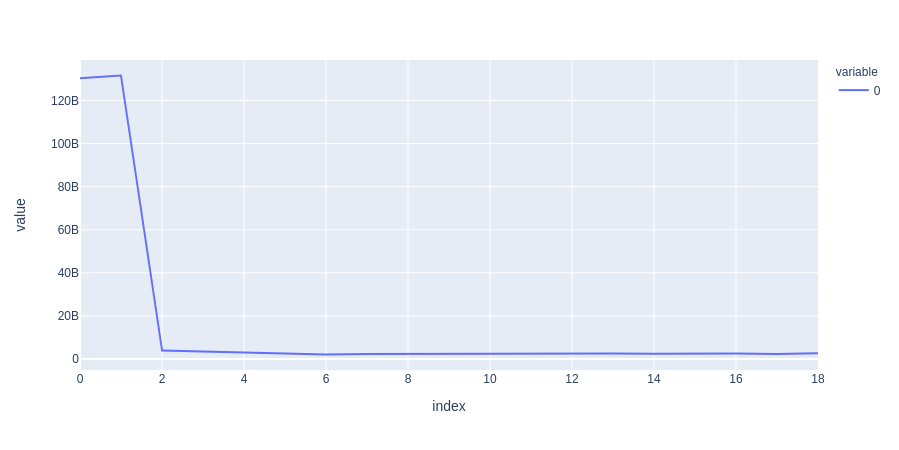

In [78]:
# Gráfico de com os valores dos MSE para as diferentes quantidades features selecionadas
pd.Series(k_vs_score[1:]).plot()

Agora que sabemos a quantidade de features que minimização o MSE, vamos selecionar e selecionar tais atributos e armazena-lós em um novo dataset e então plotar o nome desses atributos.

In [79]:
# Criando o modelo final com as 5 features selecionadas 
selector = SelectFromModel(XGBRegressor(learning_rate=0.014851035349668813,
                                        n_estimators=789,
                                        max_depth=60,
                                        min_child_weight=1,
                                        subsample=0.6863840381646759,
                                        colsample_bytree=0.9972108180790503,
                                        reg_alpha=7.545426456275705,
                                        reg_lambda=0.6316401900925547,
                                        random_state=42), max_features=8, threshold=-np.inf)
    
# Treinando o modelo para selecionar as 5 variáveis
selector.fit(X_train, y_train)
    
# Atribuindo à novas variáveis ao datasets de treino e teste
X_train_opt = pd.DataFrame(selector.transform(X_train))
X_test_opt = pd.DataFrame(selector.transform(X_test))

# Nome das variáveis selecionadas
mask = selector.get_support()

# Mostra o nome das colunas selecionadas
X_train.columns[mask]

Index(['Size', 'Suites', 'Parking', 'm2_Value', 'Size_Sqrt', 'Comercial',
       'Zone_Zona Norte', 'Zone_Zona Oeste'],
      dtype='object')

Agora que sabemos quais são as 8 variáveis que minimizam o MSE score e tornam o nosso modelo mais facilmente generalizavel, vamos treinar o modelo final e realizar a sua avaliação.

In [80]:
# Instanciando o modelo    
xgbr_opt = XGBRegressor(learning_rate=0.014851035349668813,
                        n_estimators=789,
                        max_depth=60,
                        min_child_weight=1,
                        subsample=0.6863840381646759,
                        colsample_bytree=0.9972108180790503,
                        reg_alpha=7.545426456275705,
                        reg_lambda=0.6316401900925547,
                        random_state=42)
    
# Treinando o modelo com as variáveis selecionada
xgbr_opt.fit(X_train_opt, y_train)

# Realizando as previsões
xgbr_opt_pred = xgbr_opt.predict(X_test_opt)

# Avalia o modelo
performace(y_test, xgbr_opt_pred)

MSE das previsões é 2094586073.71
RMSE das previsões é 45766.65
MAE das previsões é 9836.7


A redução do número de atributos no modelo foi muito boa, o MSE teve uma **redução aproximada de 600000000** as demais métricas utilizadas para avaliação também tiveram uma redução muito significativa.

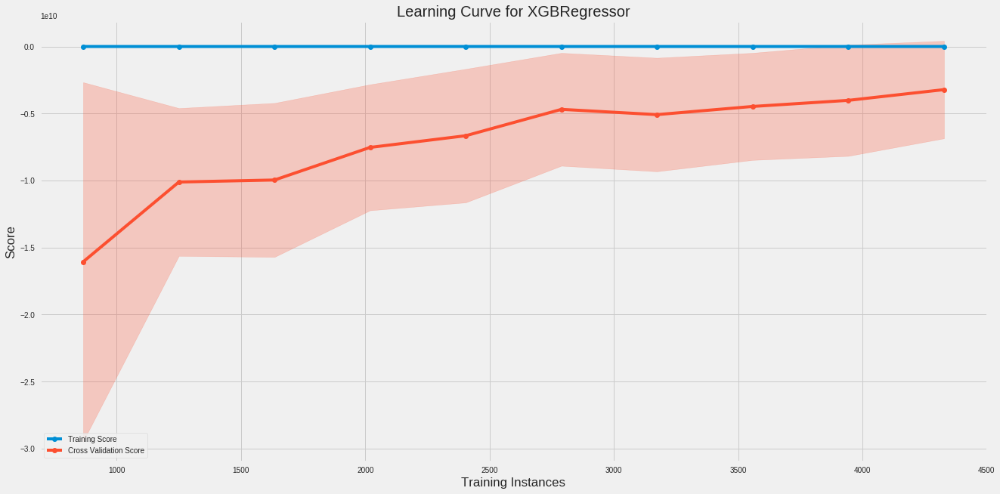

In [81]:
# Cria a divisão dos dados
cv = KFold(n_splits=10)
sizes = np.linspace(0.2, 1.0, 10)

# Instanciando o modelo de Regressão e o visualizador
visualizer = LearningCurve(xgbr_opt, 
                           cv=cv, 
                           scoring='neg_mean_squared_error', 
                           train_sizes=sizes, 
                           n_jobs=4)

# Ajuste os dados de treinamento ao visualizador
visualizer.fit(X_train_opt, y_train)

# Plota os scores da validação cruzada
visualizer.show()

Referente a curva de aprendizagem para o novo modelo fica muito nítida a diminuição no erro de teste, porém ainda seria possível diminuir esse erro com a adição de mais dados para o treinamento.

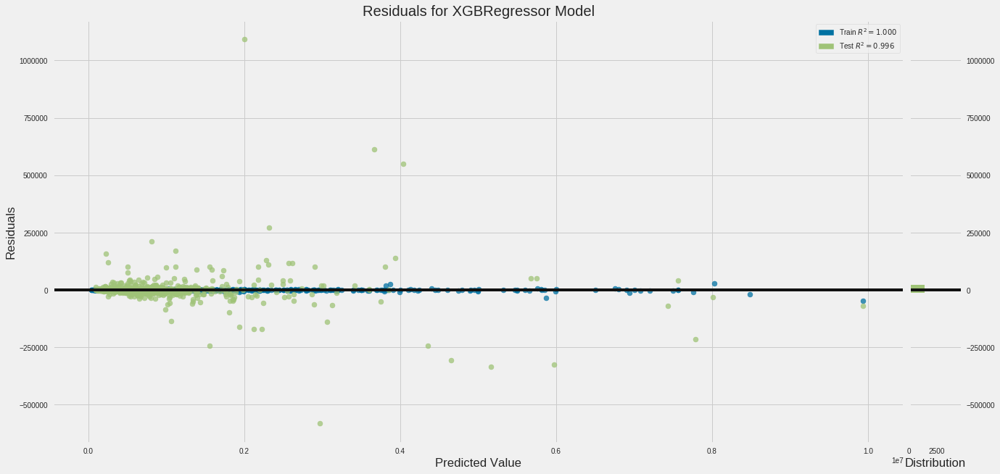

In [82]:
# Instancia o Residual Plot
visualizer = ResidualsPlot(xgbr_opt)

# Ajuste os dados de treinamento ao visualizador
visualizer.fit(X_train_opt, y_train)

# Avalie o modelo nos dados de teste
visualizer.score(X_test_opt, y_test)

# Mostra o Gráfico
visualizer.show()

Referente aos gráfico dos resíduos o modelos com os parâmetros ajustado e features reduzidas conseguiu se adptar melhor e assim reduzir os erros e até prever melhor os outliers presentes no conjunto de dados.

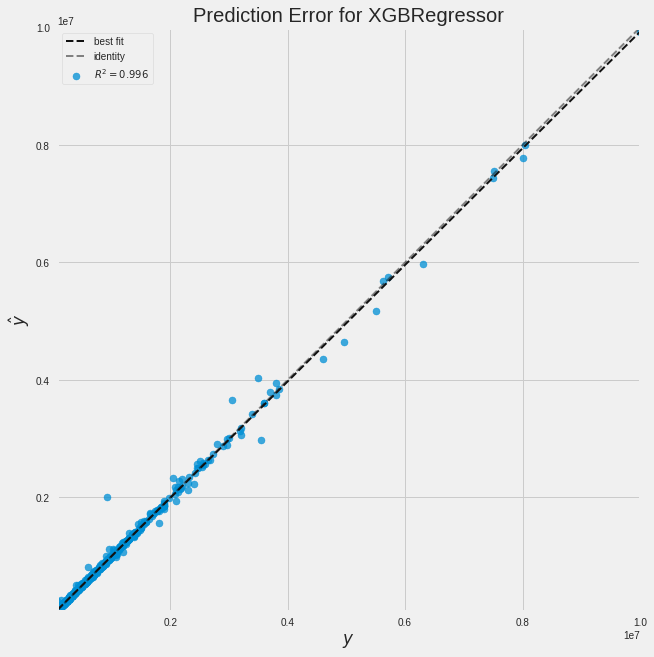

In [83]:
# Instancia o 
visualizer = PredictionError(xgbr_opt)

# Ajuste os dados de treinamento ao visualizador
visualizer.fit(X_train_opt, y_train)

# Avalie o modelo nos dados de teste
visualizer.score(X_test_opt, y_test)

# Mostra o Gráfico
visualizer.show() 

E por fim quanto gráfico de previsões dos erros é possível notar uma pequena melhora e aumento do R².

Este projeto teve a intenção de prever os preços de aluguéis para apartamentos em diferentes bairros da cidade de São Paulo, e por meio do modelo **eXtreme Gradient Boosting Regressor** e a **otimização dos seus parâmetros internos** e **seleção de atributos** foi possível prever os preços de aluguéis para grande maioria dos imóveis com um erro muito pequeno (**MSE: 2094586073.71**, **RMSE: 45766.65**, **MAE: 9836.7**) mesmo se tratando de dados com muitos valores outliers.

Como este dataset possui dados referentes a preços de aluguéis e vendas, a análise e criação de um modelos preditivo para tentar prever os preços de vendas sera feito em um segundo notebook, para se estender muito a análise em um único notebook que ficará no mesmo repositório no meu github.